In [1]:
# Importing Libraries: 

import meep as mp
import matplotlib.pyplot as plt
import numpy as np 
from IPython.display import Video 
from meep import mpb
from scipy.optimize import minimize

%matplotlib inline 

In [2]:
def tapering(start: float, end: float, n:int):
    # Function that takes in the starting length and tapers quadratically to the ending length, with n total increments
    # start - starting length
    # end - ending length 
    # n - integer for specifying number of increments (for now restricted to being even)
    N = np.arange(1,n+1)
    tapered = start - (start-end)*(N/n)**2
    return tapered

In [3]:
def tapered(width: float, length:float, xlength: float, ylengths: list, mirrorlength: float, nummirrors: int):
    # width - width of our beam in nanometers
    # length - length of our beam in nanometers
    # ylengths - the array of vertical lengths tapered
    # xlength - length of our holes along the horizontal direction
    # nummirrors - number of mirrors in one half

    c = 3e8 # Speed of light for conversion later
    conv = (c/(length*1e3))
    mp.verbosity(3)

    # Parameters for the computational cell: 
    pml_padding = length
    padding_to_pml = 4*length
    sx = 2*(len(ylengths))-1 + 2* nummirrors  # We will scale the dimensions of everything else by the length (for example we scaled the paddings above by the length)
    sy = 2*(pml_padding + padding_to_pml + width)/length  
    res = 64     # I had set the resolution to a power of two, I dont know if that will aid in the computational speed but Meep mentioned somewhere in the documentation to do this

    cell = mp.Vector3(sx,sy)

    # For the silicon we want to use and our approximate target wavelength is below: 
    eps_silicon = 12
    thickness = 220
    wavelength = 1540 

    # Defining our waveguide given the parameters, meep assumes periodic structure: 
    beam = mp.Block(size = (sx, width/length, thickness/length), material = mp.Medium(epsilon = eps_silicon) )
    holes = []
    for i in range(len(ylengths)): 
        holes.append(mp.Ellipsoid(center = mp.Vector3((-sx/2 + .5 + nummirrors) + i, 0, 0), size = mp.Vector3(xlength, ylengths[i], thickness)/length, e1 = mp.Vector3(1,0,0), e2 = mp.Vector3(0,1,0), e3 = mp.Vector3(0,0,1),
                          material = mp.Medium(epsilon = 1)))
        holes.append(mp.Ellipsoid(center = mp.Vector3((+sx/2 - .5 - nummirrors) - i, 0, 0), size = mp.Vector3(xlength, ylengths[i], thickness)/length, e1 = mp.Vector3(1,0,0), e2 = mp.Vector3(0,1,0), e3 = mp.Vector3(0,0,1),
                          material = mp.Medium(epsilon = 1)))

    for i in range(nummirrors): 
        holes.append(mp.Ellipsoid( center = mp.Vector3((-sx/2 + 0.5) + i , 0, 0 ), size = mp.Vector3(xlength, mirrorlength, thickness)/length, e1 = mp.Vector3(1,0,0), 
                     e2 = mp.Vector3(0,1,0), e3 = mp.Vector3(0,0,1)))
        holes.append(mp.Ellipsoid( center = mp.Vector3((+sx/2 - 0.5) - i , 0, 0 ), size = mp.Vector3(xlength, mirrorlength, thickness)/length, e1 = mp.Vector3(1,0,0), 
                     e2 = mp.Vector3(0,1,0), e3 = mp.Vector3(0,0,1)))

    geometry = [beam]+holes

    # Other things for simulation: It is to note that say we want to run for a certian number of periods, then we would divide our time by the frequency below
    fcenter = length/wavelength           # In meep units, the frequency is specified by 1/lambda according to https://meep.readthedocs.io/en/latest/Introduction/#units-in-meep
    df = .3

    # Broad source to excite modes
    source = mp.Source(mp.GaussianSource(fcenter, fwidth = df), mp.Hz, mp.Vector3(0, 0))
    pml_layers = [mp.PML(pml_padding/length, direction = mp.Y)]

    sym = [mp.Mirror(mp.X, phase = -1), mp.Mirror(mp.Y, phase = -1)]

    simulation = mp.Simulation(
        cell_size = cell, 
        boundary_layers = pml_layers, 
        geometry = geometry, 
        sources = [source], 
        resolution = res,
        symmetries = sym
        )

    f = plt.figure()
    simulation.plot2D(ax = f.gca())
    f.gca().xaxis.set_visible(False)
    f.suptitle('Geometry of Simulation')
    plt.axvline(x = -(sx/2) + nummirrors , color = 'k', linestyle = '--')
    plt.axvline(x = (sx/2) - nummirrors , color = 'k', linestyle = '--')
    plt.show()
    plt.close()

    h = mp.Harminv(mp.Hz, mp.Vector3(), fcenter, df)

    simulation.run(mp.at_beginning(mp.output_epsilon),
        mp.after_sources(h),
        until_after_sources=1200)


    freqs = [m.freq for m in h.modes]
    Qs = [m.Q for m in h.modes]
    
    print(np.array(freqs)*conv)
    print(Qs)

    maxq = max(Qs)
    ind = Qs.index(maxq)
    freq_maxq = freqs[ind]*conv
    
    #ind2 = np.isclose(f,.225, .01)
    print(f'The Frequency of the highest Q is {freq_maxq} THz')
    source_new = mp.Source(mp.GaussianSource(freqs[ind], fwidth = .1), mp.Hz, mp.Vector3(0, 0))
    sim2  = mp.Simulation(
        cell_size = cell, 
        boundary_layers = pml_layers, 
        geometry = geometry, 
        sources = [source_new], 
        resolution = res,
        symmetries = sym
        )
    sim2.run(until_after_sources=600)
    f = plt.figure(dpi=150)
    plt.axvline(x = -(sx/2) + nummirrors , color = 'k', linestyle = '--')
    plt.axvline(x = (sx/2) - nummirrors , color = 'k', linestyle = '--')
    sim2.plot2D(ax=f.gca(), fields=mp.Ex)
    plt.show()

    f2 = plt.figure(dpi=150)
    plt.axvline(x = -(sx/2) + nummirrors , color = 'k', linestyle = '--')
    plt.axvline(x = (sx/2) - nummirrors , color = 'k', linestyle = '--')
    sim2.plot2D(ax=f2.gca(), fields=mp.Ey)
    plt.show()

    f3 = plt.figure(dpi=150)
    plt.axvline(x = -(sx/2) + nummirrors , color = 'k', linestyle = '--')
    plt.axvline(x = (sx/2) - nummirrors , color = 'k', linestyle = '--')
    sim2.plot2D(ax=f3.gca(), fields=mp.Ez)
    plt.show()

    f4 = plt.figure(dpi=150)
    plt.axvline(x = -(sx/2) + nummirrors , color = 'k', linestyle = '--')
    plt.axvline(x = (sx/2) - nummirrors , color = 'k', linestyle = '--')
    sim2.plot2D(ax=f4.gca(), fields=mp.Hx)
    plt.show()

    f5 = plt.figure(dpi=150)
    plt.axvline(x = -(sx/2) + nummirrors , color = 'k', linestyle = '--')
    plt.axvline(x = (sx/2) - nummirrors , color = 'k', linestyle = '--')
    sim2.plot2D(ax=f5.gca(), fields=mp.Hy)
    plt.show()

    f6 = plt.figure(dpi=150)
    plt.axvline(x = -(sx/2) + nummirrors , color = 'k', linestyle = '--')
    plt.axvline(x = (sx/2) - nummirrors , color = 'k', linestyle = '--')
    sim2.plot2D(ax=f6.gca(), fields=mp.Hz)
    plt.show()
    

    #h = mp.Harminv(mp.Hz, mp.Vector3(), fcenter, df)
    #simulation.run(mp.after_sources(h), until_after_sources=400)

    #f = plt.figure(dpi=150)
    #Animate = mp.Animate2D(f=f, fields=mp.Hz, realtime=False, normalize=True)

    #simulation.run(mp.at_every(1 / fcenter / 20, Animate), until=20 / fcenter)
    #plt.close()

    #simulation.reset_meep()

    #simulation = mp.Simulation(
     #   cell_size = cell,
     #   boundary_layers = pml_layers,
     #   geometry = geometry,
     #   sources = [source],
     #   resolution = res,
     #   symmetries = sym
    #)

    #f = plt.figure(dpi = 150)
    #f.gca().xaxis.set_visible(False)
    #Animate = mp.Animate2D(fields=mp.Hz, f=f, realtime=False, normalize=False)

    #simulation.run(
       # mp.at_every(.5, Animate),
       # until=300
    #)

    #plt.close() 
    #filename = "Media/Excitation.mp4" 
    #Animate.to_mp4(30,filename) 
    #Video(filename)

    return Qs, freqs

     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

, center = (-3,0,0)
          size (0.646884,0.905045,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (3,0,0)
          size (0.646884,0.905045,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-2,0,0)
          size (0.646884,0.807122,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (2,0,0)
          size (0.646884,0.807122,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-1,0,0)
          size (0.646884,0.691395,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (1,0,0)
          size (0.646884,0.691395,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectr

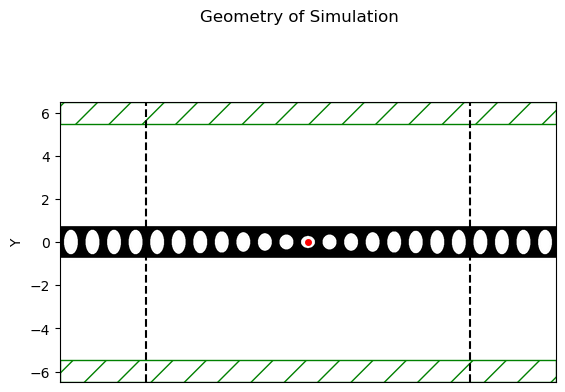

-----------
Initializing structure...
Halving computational cell along direction x
Halving computational cell along direction y
time for choose_chunkdivision = 0.000832796 s
Working in 2D dimensions.
Computational cell is 23 x 12.9688 x 0 with resolution 64
     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.

harminv0:, frequency, imag. freq., Q, |amp|, amplitude, error
harminv0:, 0.10049000644435709, -0.00012831854873837265, 391.56461568640833, 0.005814952937660904, 0.003171669432590852-0.004873827107887599i, 3.817625646559381e-06+0.0i
harminv0:, 0.11601218389979476, -1.907079031333221e-05, 3041.619722982632, 0.012424020486104751, -0.01103216137640098-0.005713816623256034i, 1.5066984472474474e-07+0.0i
harminv0:, 0.12974298256887798, 1.944427656761124e-06, -33362.7692749942, 0.02402684170302185, -0.012532341877013053+0.020499500708547388i, 4.670228684447423e-08+0.0i
harminv0:, 0.14288472997695953, 1.0236403914655237e-07, -697924.4428426401, 0.0429538701542545, 0.03166773790213143+0.029020498572396445i, 6.882514171540847e-08+0.0i
harminv0:, 0.15557771471525636, -2.2095567748191686e-06, 35205.63863492237, 0.07368263975168612, 0.061459383458572346-0.04064327232973398i, 1.1288999359235498e-07+0.0i
harminv0:, 0.16751972339653162, -7.0874530719356e-08, 1181804.8154693572, 0.11835983042103922, -0.

run 0 finished at t = 700.0 (89600 timesteps)
     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          ax

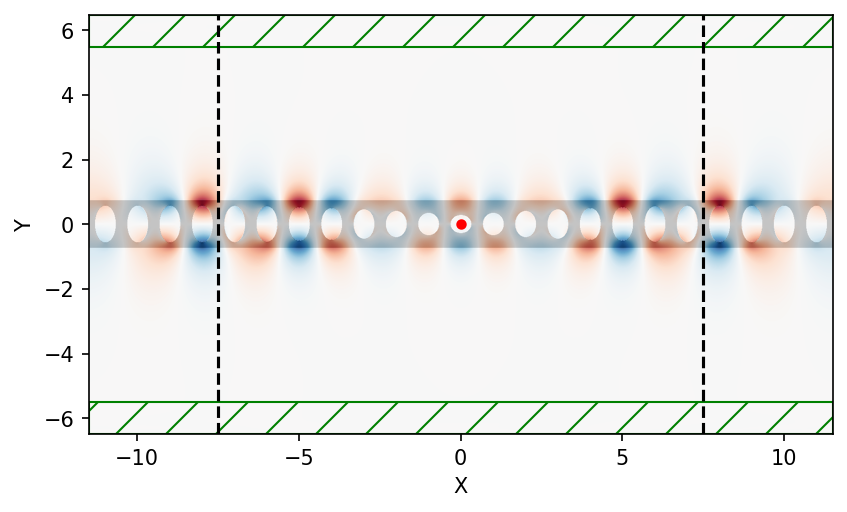

     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

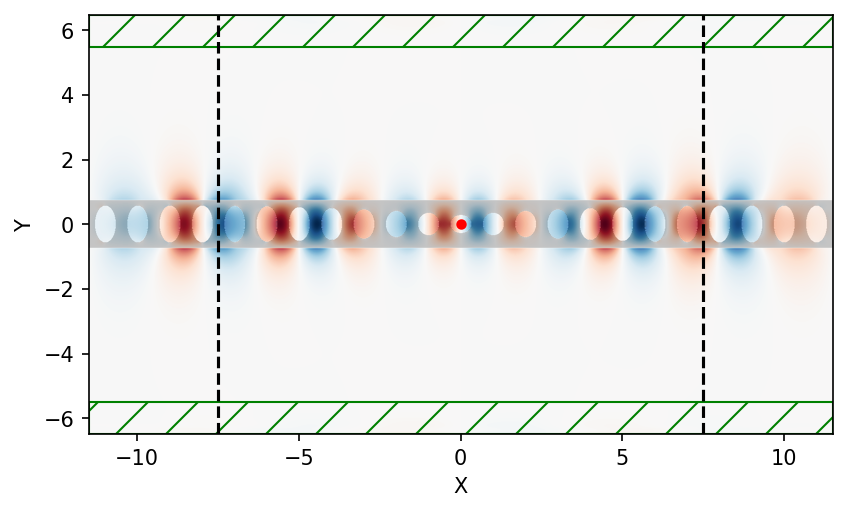

     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

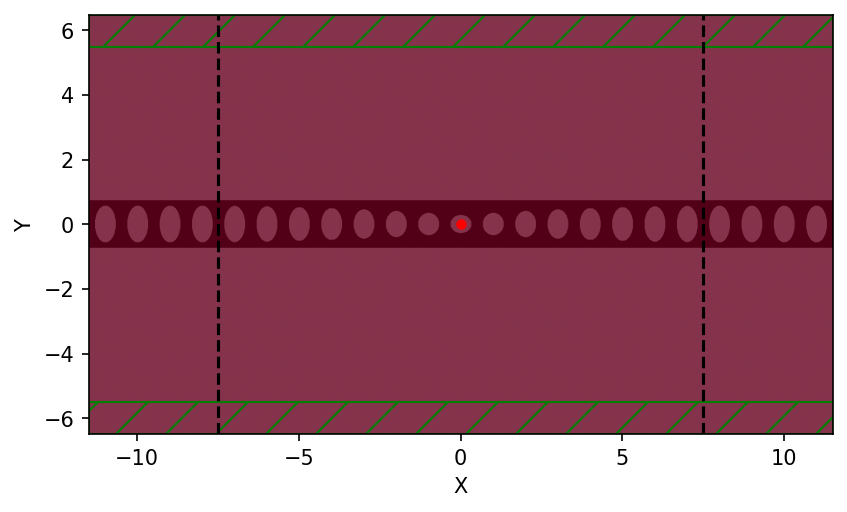

     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

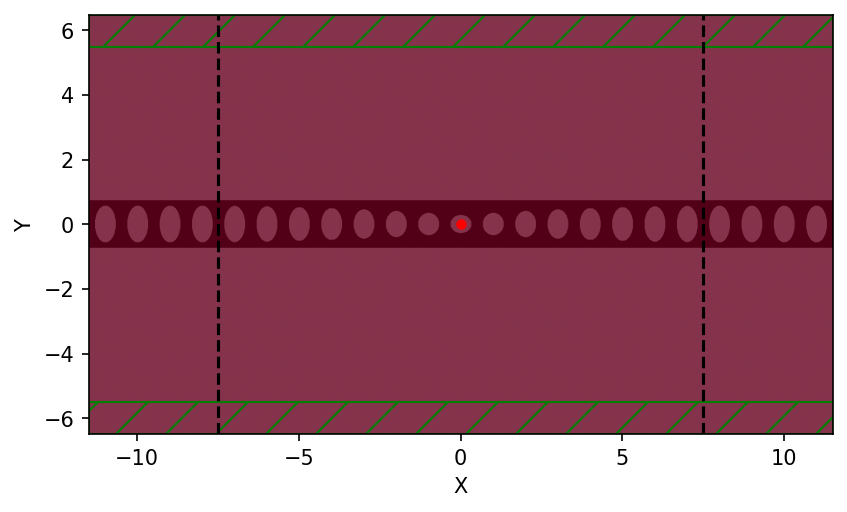

     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

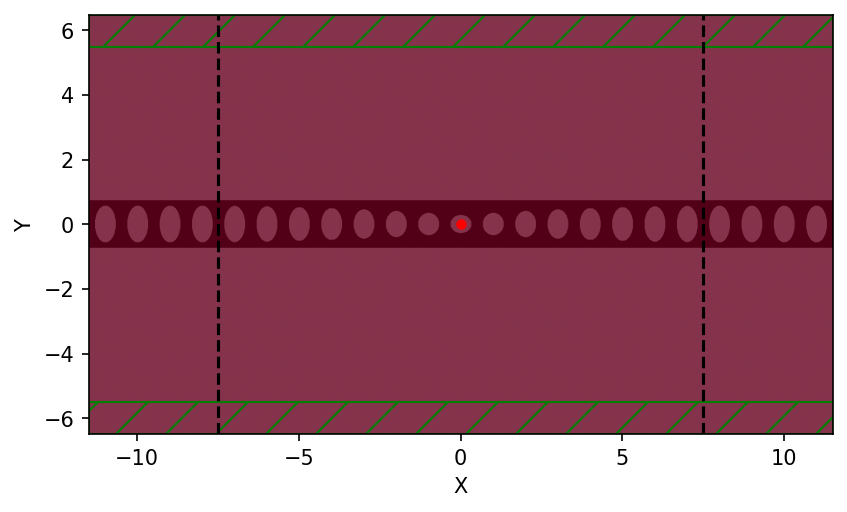

     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

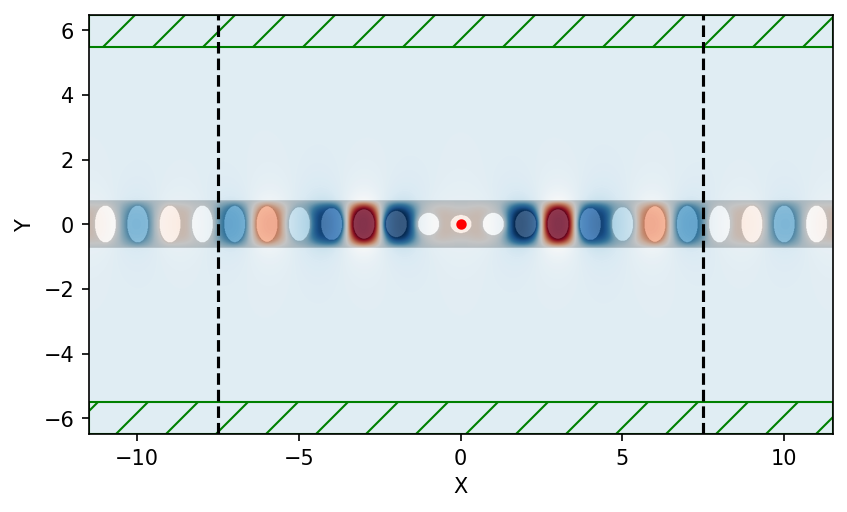

In [4]:
taperr = tapering(380,188,8)
Qs, freqs = tapered(500, length = 337, xlength= 218, ylengths = taperr, mirrorlength=382, nummirrors = 4)

In [5]:
def simulations(width: float, length:float, xlength: float, ylengths: list, mirrorlength: float, nummirrors: int, freq: float):
    # width - width of our beam in nanometers
    # length - length of our beam in nanometers
    # ylengths - the array of vertical lengths tapered
    # xlength - length of our holes along the horizontal direction
    # nummirrors - number of mirrors in one half

    c = 3e8 # Speed of light for conversion later
    conv = (c/(length*1e3))
    mp.verbosity(3)

    # Parameters for the computational cell: 
    pml_padding = length
    padding_to_pml = 4*length
    sx = 2*(len(ylengths))-1 + 2* nummirrors  # We will scale the dimensions of everything else by the length (for example we scaled the paddings above by the length)
    sy = 2*(pml_padding + padding_to_pml + width)/length  
    res = 64     # I had set the resolution to a power of two, I dont know if that will aid in the computational speed but Meep mentioned somewhere in the documentation to do this

    cell = mp.Vector3(sx,sy)

    # For the silicon we want to use and our approximate target wavelength is below: 
    eps_silicon = 12
    thickness = 220
    wavelength = 1540 

    # Defining our waveguide given the parameters, meep assumes periodic structure: 
    beam = mp.Block(size = (sx, width/length, thickness/length), material = mp.Medium(epsilon = eps_silicon) )
    holes = []
    for i in range(len(ylengths)): 
        holes.append(mp.Ellipsoid(center = mp.Vector3((-sx/2 + .5 + nummirrors) + i, 0, 0), size = mp.Vector3(xlength, ylengths[i], thickness)/length, e1 = mp.Vector3(1,0,0), e2 = mp.Vector3(0,1,0), e3 = mp.Vector3(0,0,1),
                          material = mp.Medium(epsilon = 1)))
        holes.append(mp.Ellipsoid(center = mp.Vector3((+sx/2 - .5 - nummirrors) - i, 0, 0), size = mp.Vector3(xlength, ylengths[i], thickness)/length, e1 = mp.Vector3(1,0,0), e2 = mp.Vector3(0,1,0), e3 = mp.Vector3(0,0,1),
                          material = mp.Medium(epsilon = 1)))

    for i in range(nummirrors): 
        holes.append(mp.Ellipsoid( center = mp.Vector3((-sx/2 + 0.5) + i , 0, 0 ), size = mp.Vector3(xlength, mirrorlength, thickness)/length, e1 = mp.Vector3(1,0,0), 
                     e2 = mp.Vector3(0,1,0), e3 = mp.Vector3(0,0,1)))
        holes.append(mp.Ellipsoid( center = mp.Vector3((+sx/2 - 0.5) - i , 0, 0 ), size = mp.Vector3(xlength, mirrorlength, thickness)/length, e1 = mp.Vector3(1,0,0), 
                     e2 = mp.Vector3(0,1,0), e3 = mp.Vector3(0,0,1)))

    geometry = [beam]+holes

    # Other things for simulation: It is to note that say we want to run for a certian number of periods, then we would divide our time by the frequency below
    fcenter = freq          # In meep units, the frequency is specified by 1/lambda according to https://meep.readthedocs.io/en/latest/Introduction/#units-in-meep
    df = .1

    # Broad source to excite modes
    source = mp.Source(mp.GaussianSource(fcenter, fwidth = df), mp.Hz, mp.Vector3(0, 0))
    pml_layers = [mp.PML(pml_padding/length, direction = mp.Y)]

    sym = [mp.Mirror(mp.X, phase = -1), mp.Mirror(mp.Y, phase = -1)]

    simulation = mp.Simulation(
        cell_size = cell, 
        boundary_layers = pml_layers, 
        geometry = geometry, 
        sources = [source], 
        resolution = res,
        symmetries = sym
        )

    simulation.run(until_after_sources=600)
    f = plt.figure(dpi=150)
    plt.axvline(x = -(sx/2) + nummirrors , color = 'k', linestyle = '--')
    plt.axvline(x = (sx/2) - nummirrors , color = 'k', linestyle = '--')
    simulation.plot2D(ax=f.gca(), fields=mp.Ex)
    plt.title(f'For freq {freq*conv}')
    plt.show()

    f2 = plt.figure(dpi=150)
    plt.axvline(x = -(sx/2) + nummirrors , color = 'k', linestyle = '--')
    plt.axvline(x = (sx/2) - nummirrors , color = 'k', linestyle = '--')
    simulation.plot2D(ax=f2.gca(), fields=mp.Ey)
    plt.show()

    f3 = plt.figure(dpi=150)
    plt.axvline(x = -(sx/2) + nummirrors , color = 'k', linestyle = '--')
    plt.axvline(x = (sx/2) - nummirrors , color = 'k', linestyle = '--')
    simulation.plot2D(ax=f3.gca(), fields=mp.Ez)
    plt.show()

    f4 = plt.figure(dpi=150)
    plt.axvline(x = -(sx/2) + nummirrors , color = 'k', linestyle = '--')
    plt.axvline(x = (sx/2) - nummirrors , color = 'k', linestyle = '--')
    simulation.plot2D(ax=f4.gca(), fields=mp.Hx)
    plt.show()

    f5 = plt.figure(dpi=150)
    plt.axvline(x = -(sx/2) + nummirrors , color = 'k', linestyle = '--')
    plt.axvline(x = (sx/2) - nummirrors , color = 'k', linestyle = '--')
    simulation.plot2D(ax=f5.gca(), fields=mp.Hy)
    plt.show()

    f6 = plt.figure(dpi=150)
    plt.axvline(x = -(sx/2) + nummirrors , color = 'k', linestyle = '--')
    plt.axvline(x = (sx/2) - nummirrors , color = 'k', linestyle = '--')
    simulation.plot2D(ax=f6.gca(), fields=mp.Hz)
    plt.show()

0.10049000644435709
-----------
Initializing structure...
Halving computational cell along direction x
Halving computational cell along direction y
time for choose_chunkdivision = 0.00487494 s
Working in 2D dimensions.
Computational cell is 23 x 12.9688 x 0 with resolution 64
     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)

run 0 finished at t = 700.0 (89600 timesteps)
     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          ax

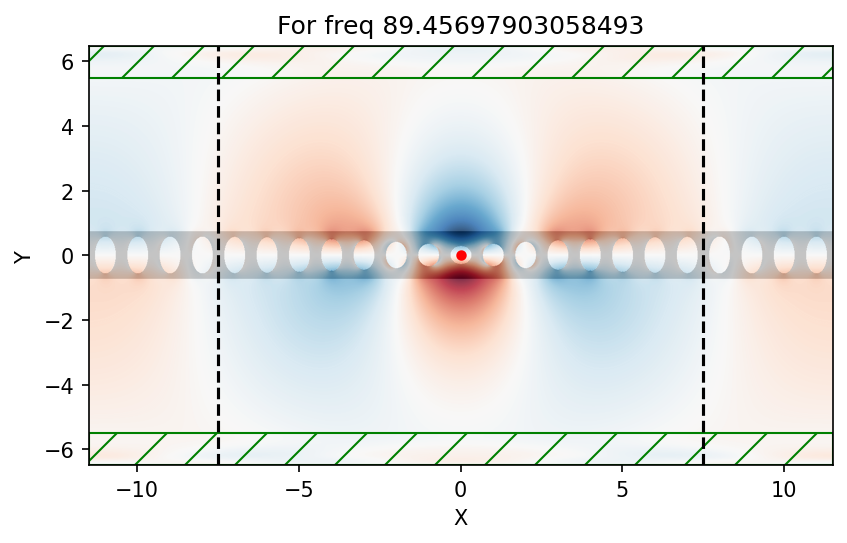

     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

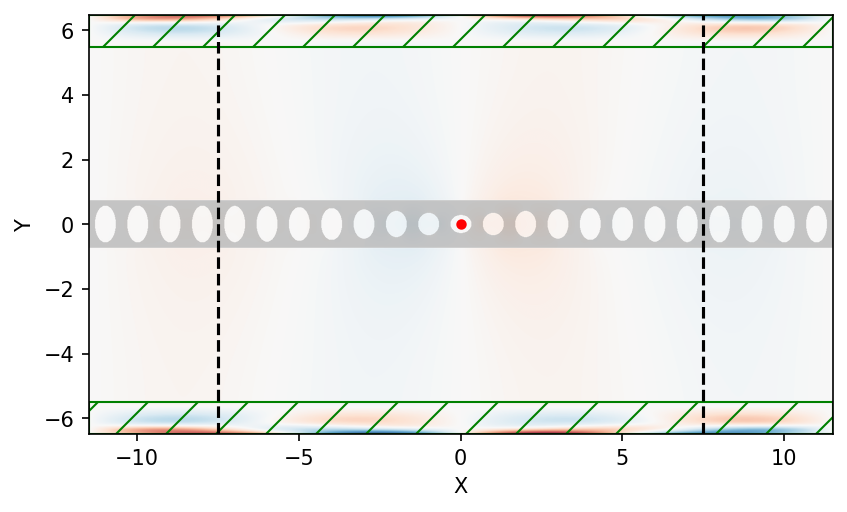

     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

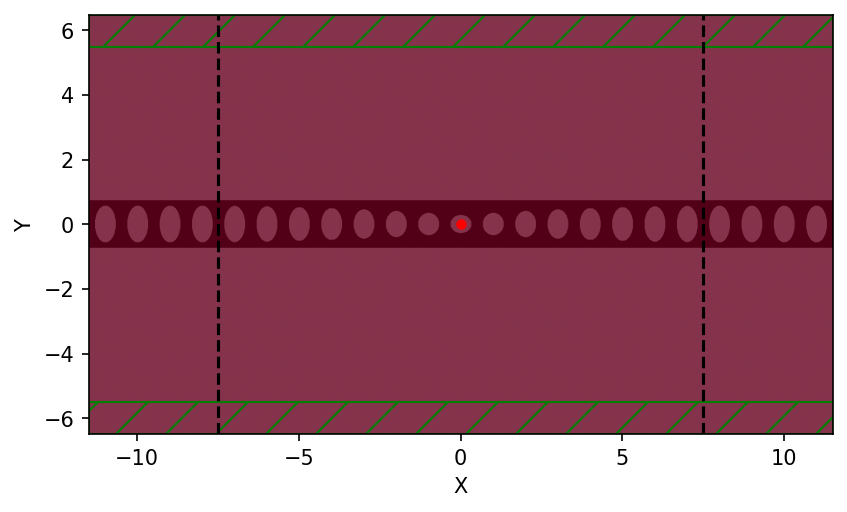

     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

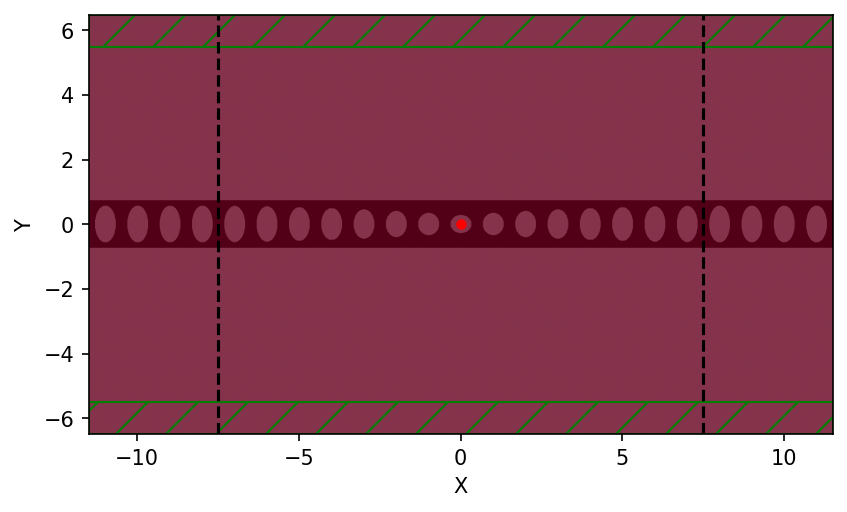

     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

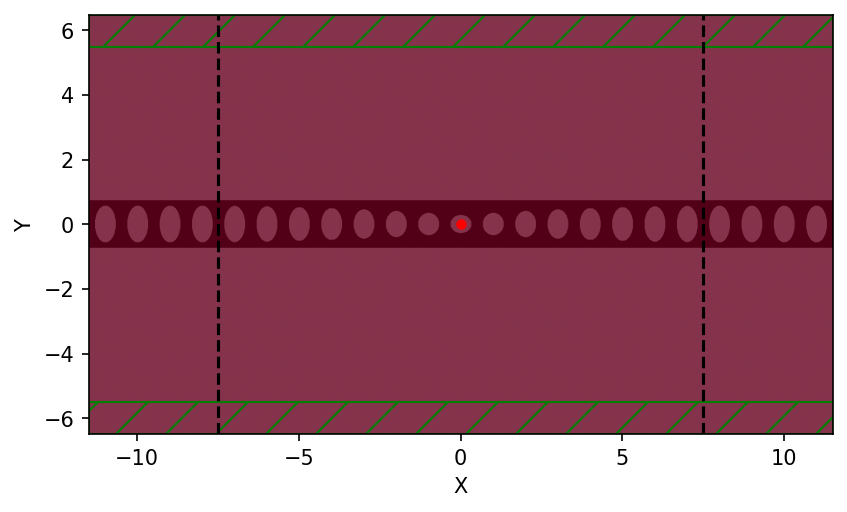

     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

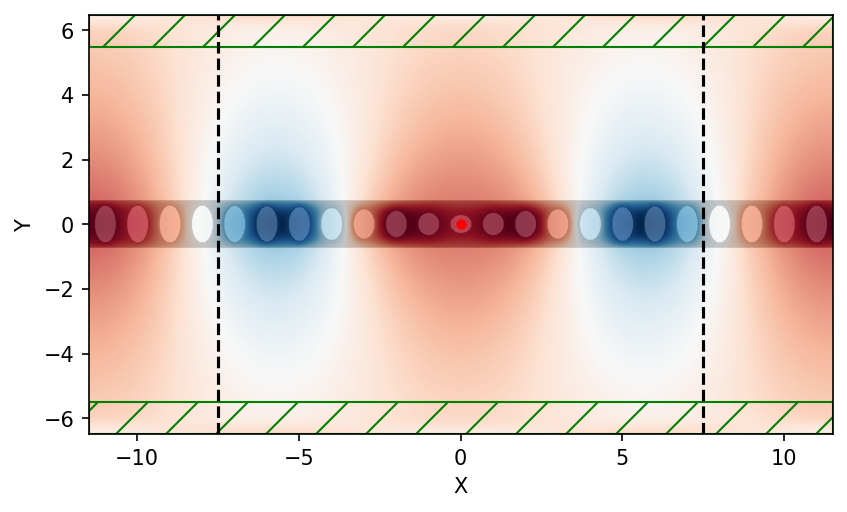

0.11601218389979476
-----------
Initializing structure...
Halving computational cell along direction x
Halving computational cell along direction y
time for choose_chunkdivision = 0.00102806 s
Working in 2D dimensions.
Computational cell is 23 x 12.9688 x 0 with resolution 64
     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)

run 0 finished at t = 700.0 (89600 timesteps)
     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          ax

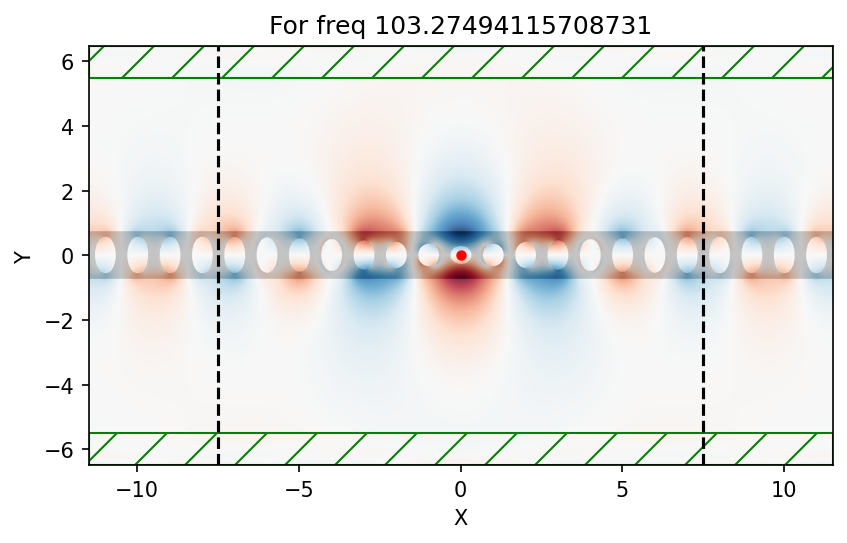

     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

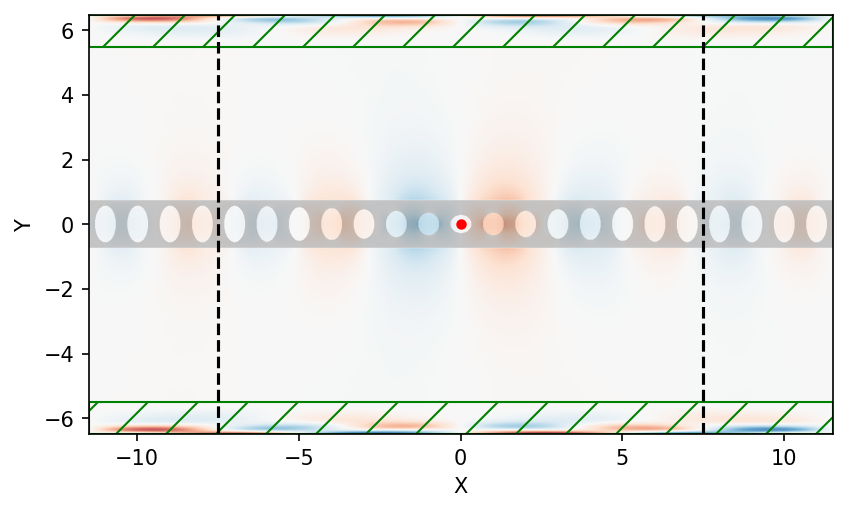

     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

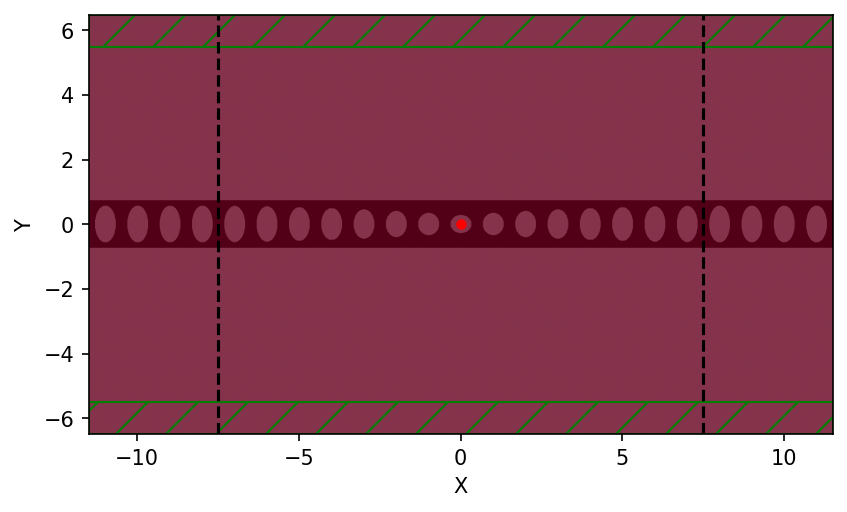

     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

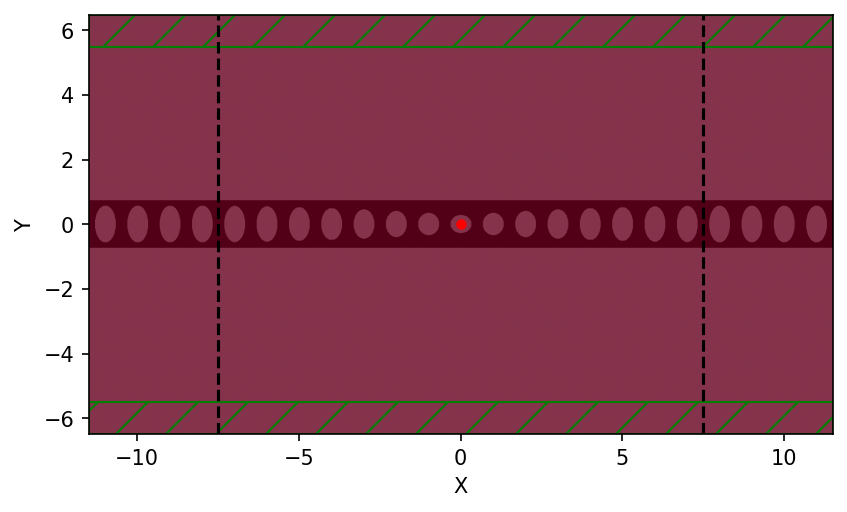

     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

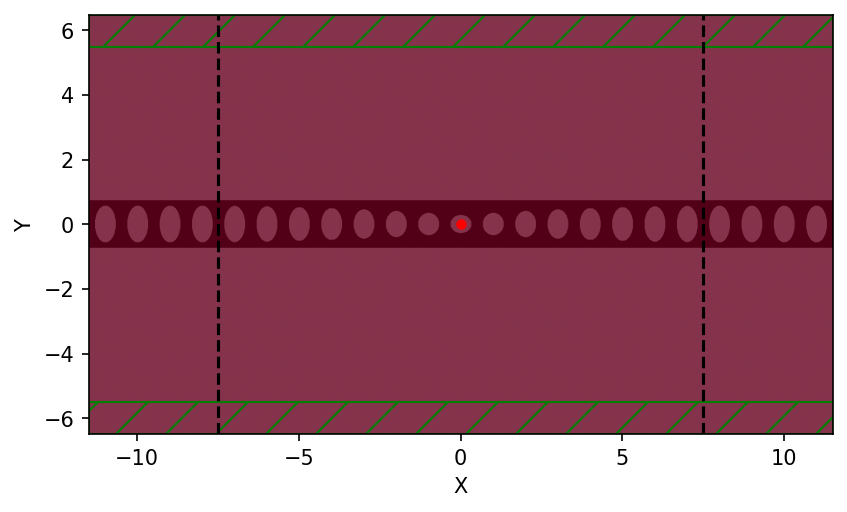

     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

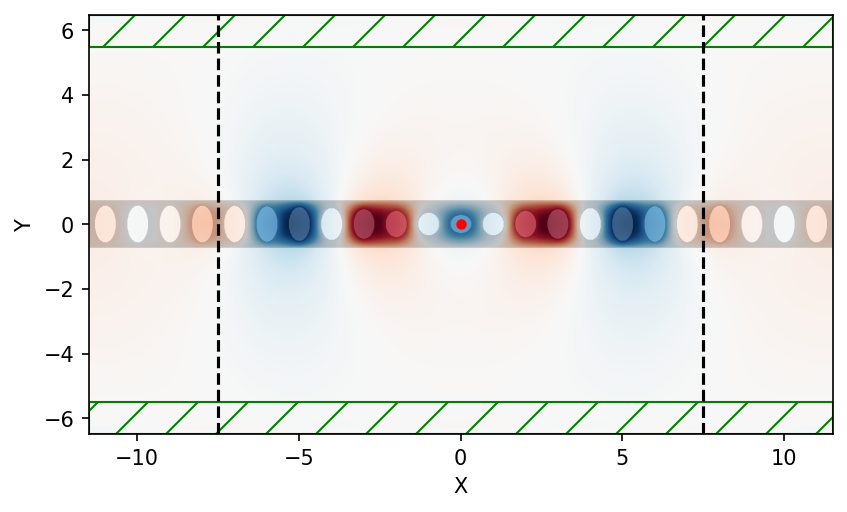

0.15557771471525636
-----------
Initializing structure...
Halving computational cell along direction x
Halving computational cell along direction y
time for choose_chunkdivision = 0.00126886 s
Working in 2D dimensions.
Computational cell is 23 x 12.9688 x 0 with resolution 64
     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)

run 0 finished at t = 700.0 (89600 timesteps)
     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          ax

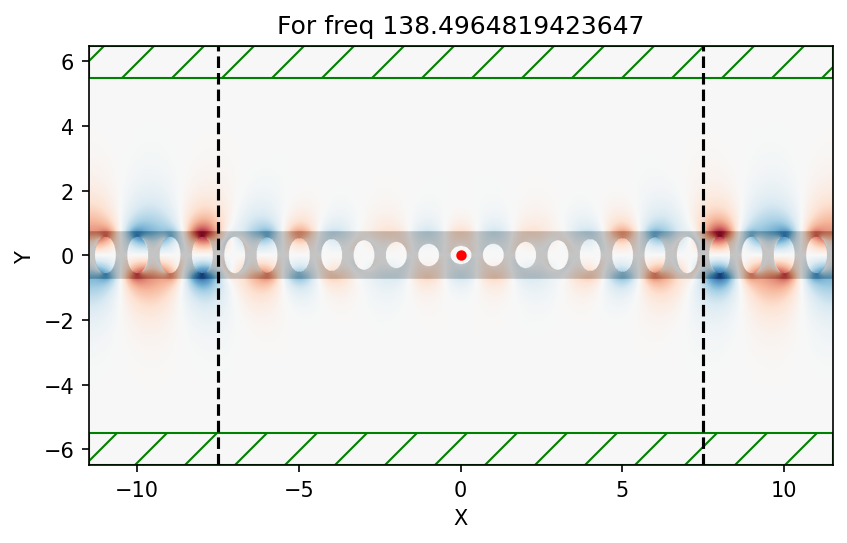

     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

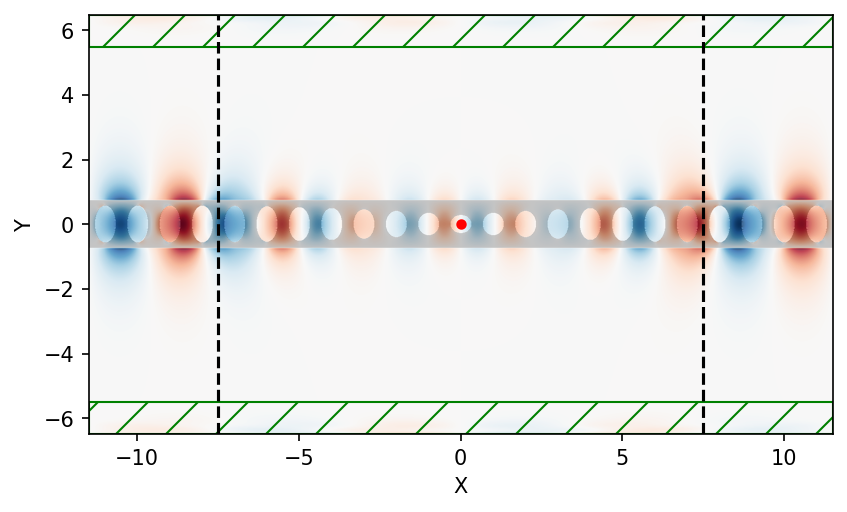

     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

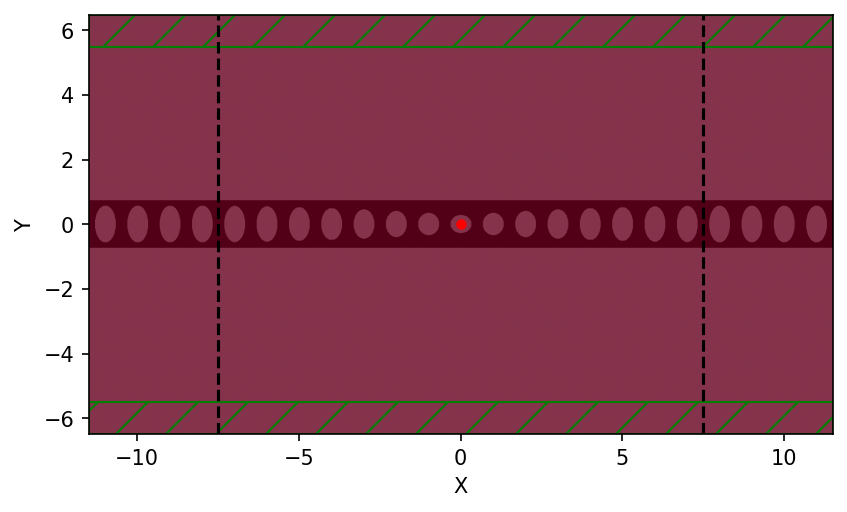

     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

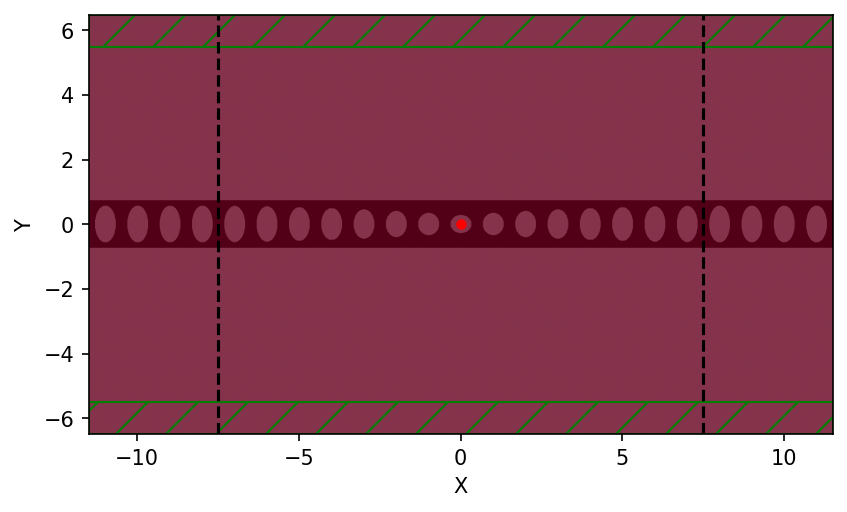

     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

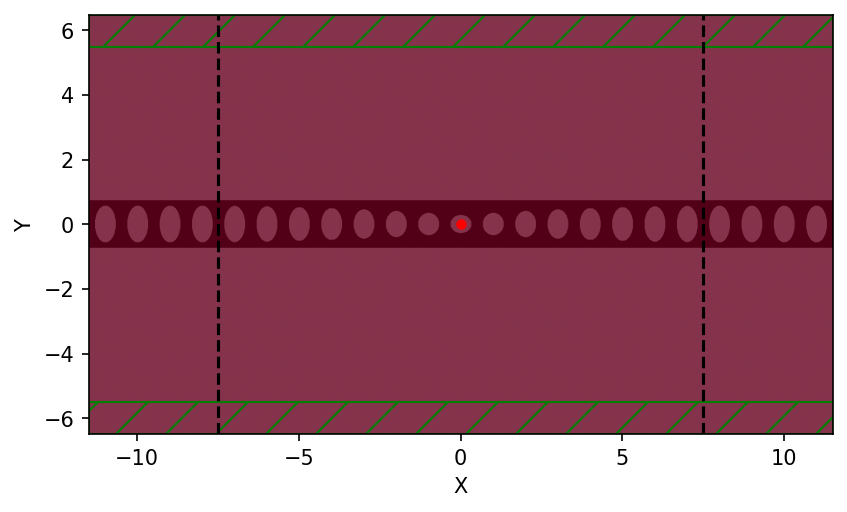

     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

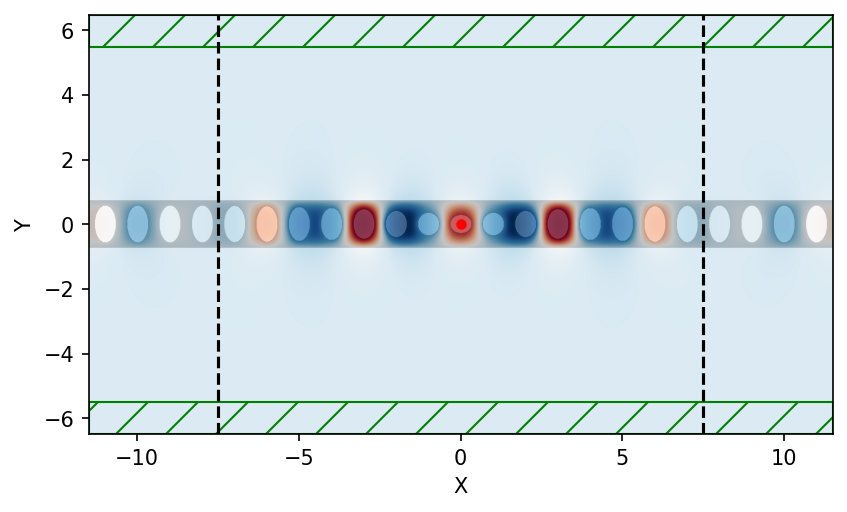

0.16751972339653162
-----------
Initializing structure...
Halving computational cell along direction x
Halving computational cell along direction y
time for choose_chunkdivision = 0.00135398 s
Working in 2D dimensions.
Computational cell is 23 x 12.9688 x 0 with resolution 64
     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)

run 0 finished at t = 700.0 (89600 timesteps)
     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          ax

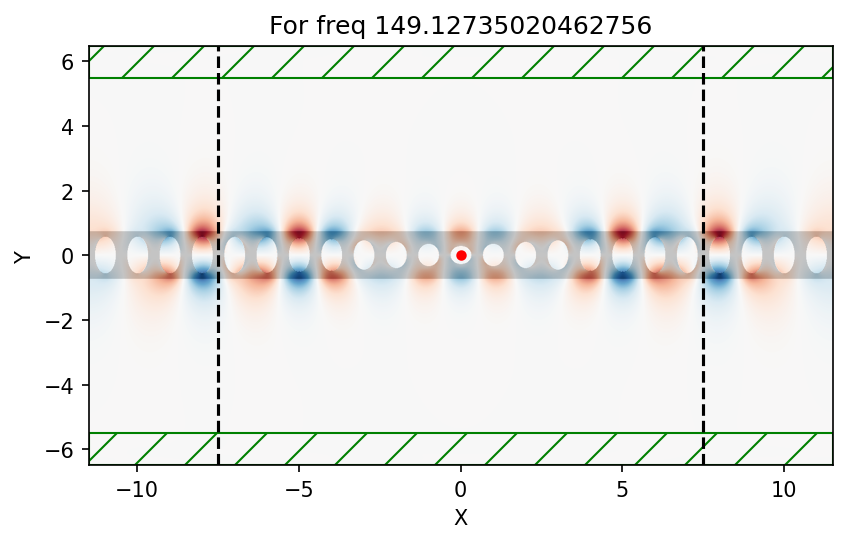

     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

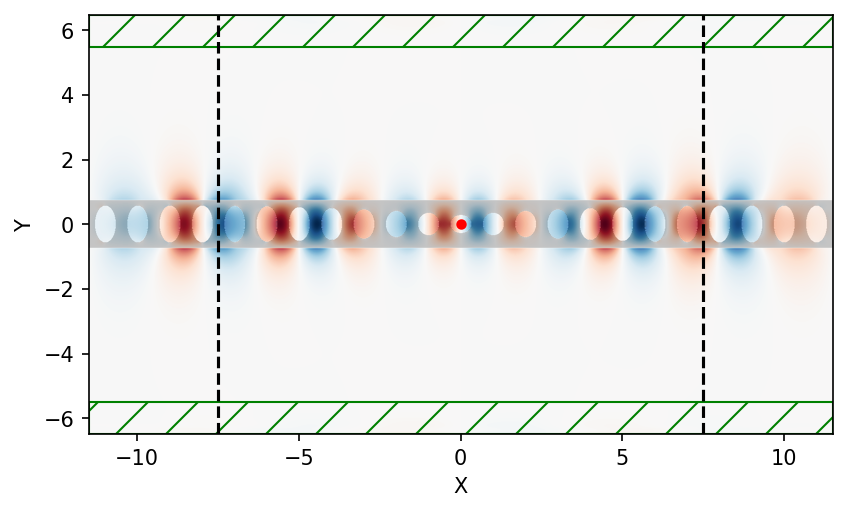

     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

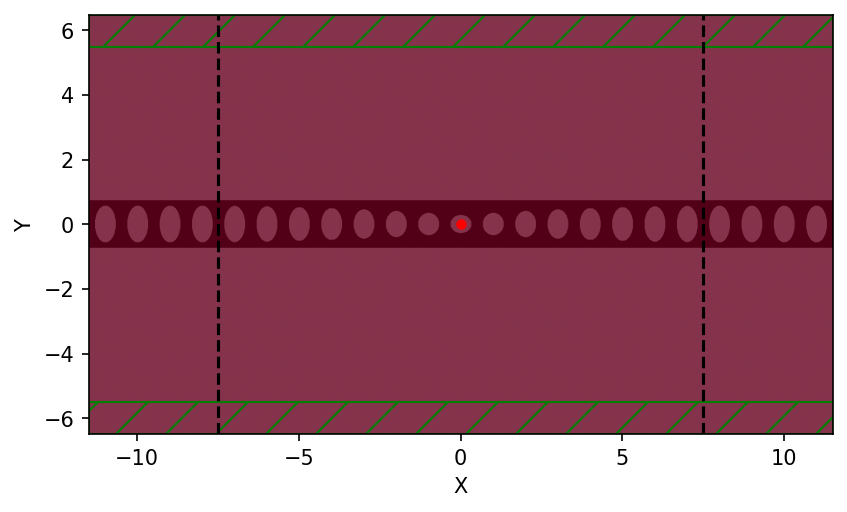

     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

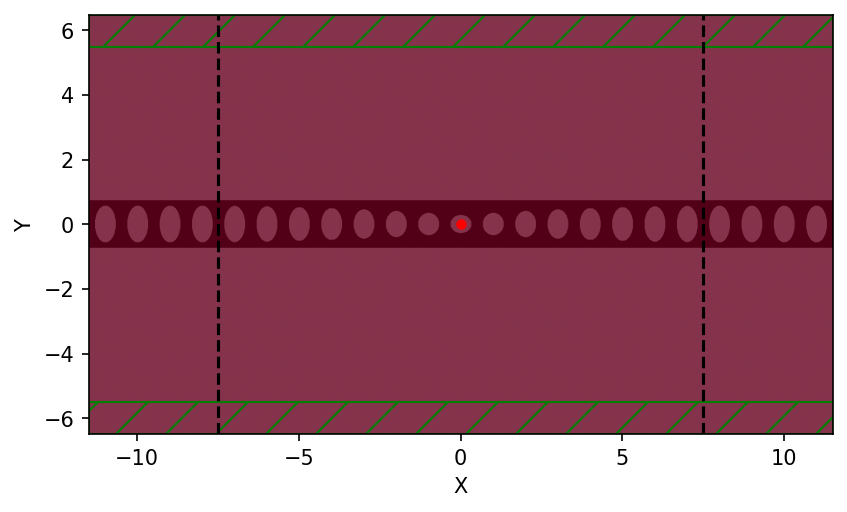

     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

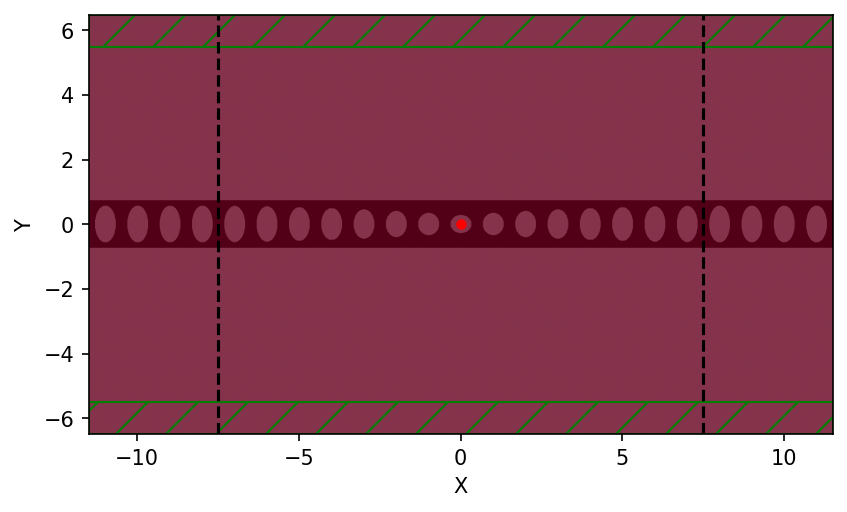

     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

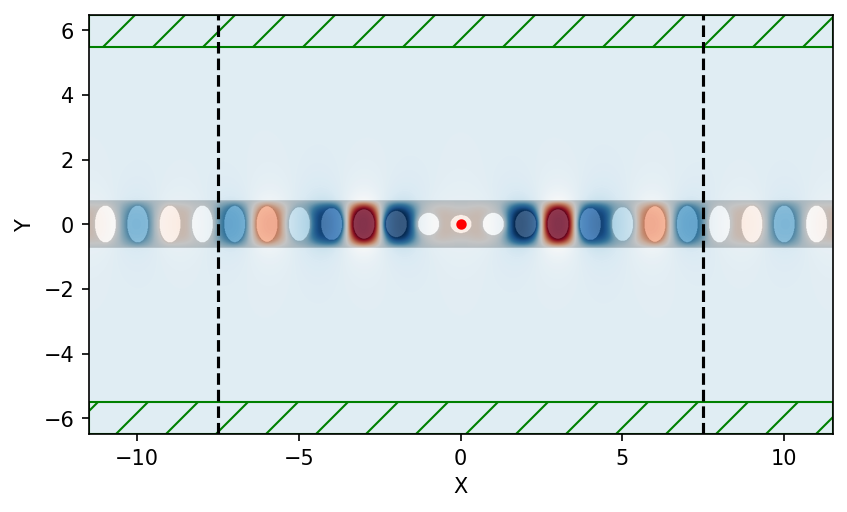

0.17795357351469063
-----------
Initializing structure...
Halving computational cell along direction x
Halving computational cell along direction y
time for choose_chunkdivision = 0.00134301 s
Working in 2D dimensions.
Computational cell is 23 x 12.9688 x 0 with resolution 64
     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)

run 0 finished at t = 700.0 (89600 timesteps)
     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          ax

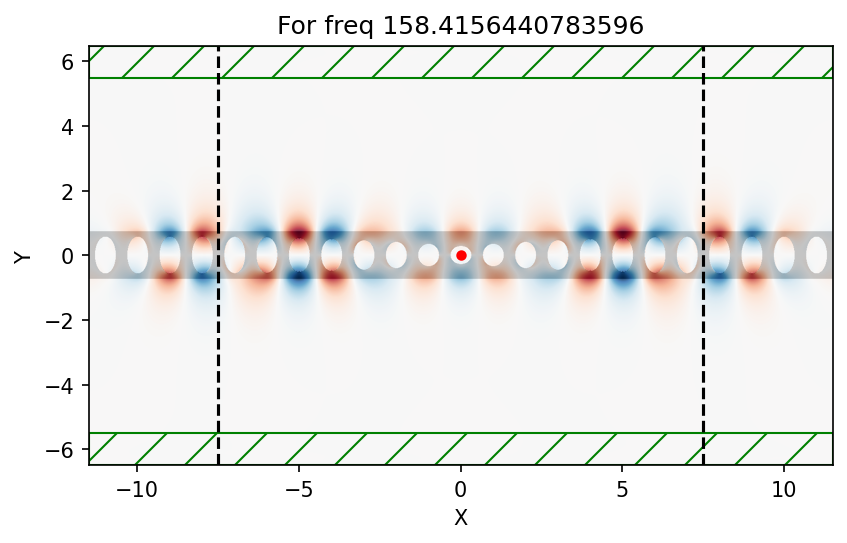

     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

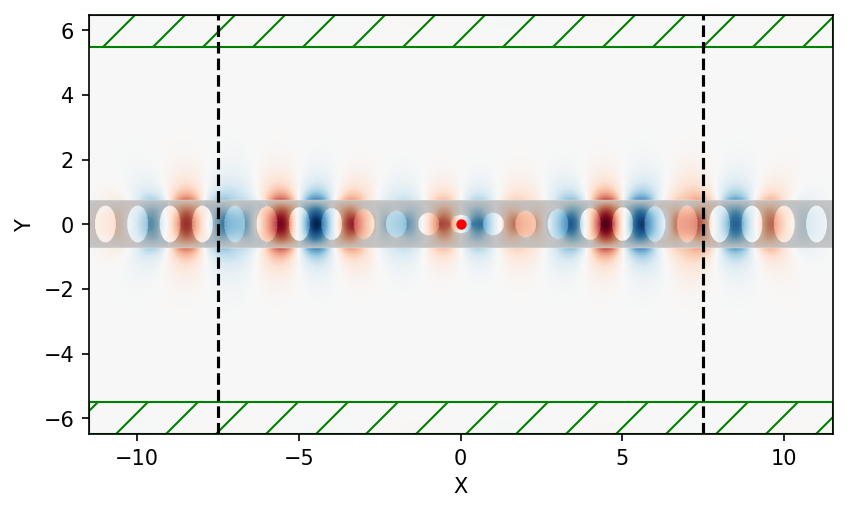

     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

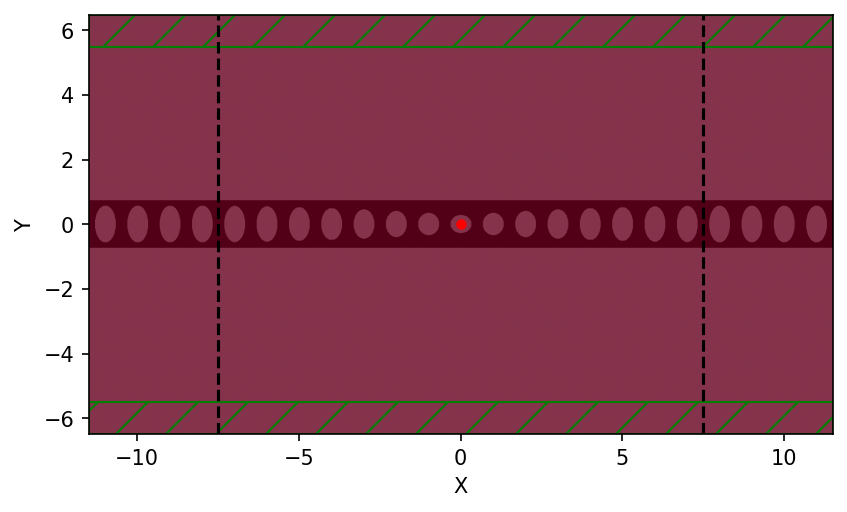

     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

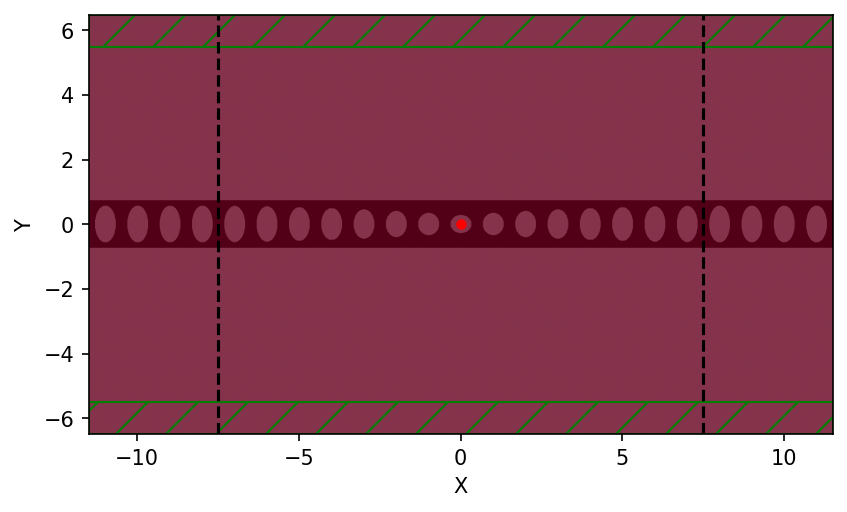

     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

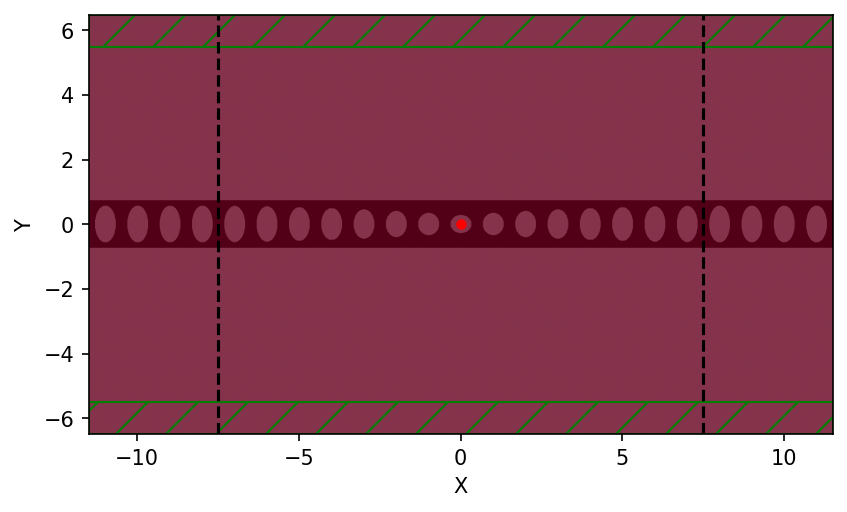

     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

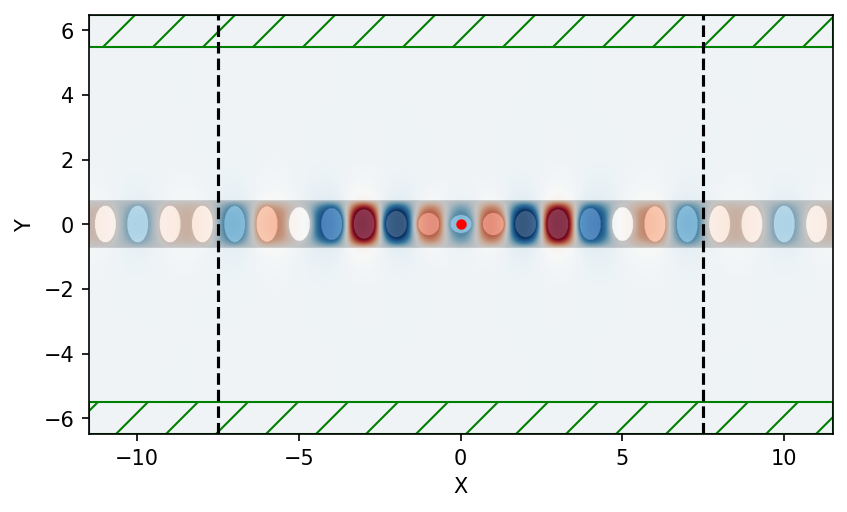

0.18524282460506156
-----------
Initializing structure...
Halving computational cell along direction x
Halving computational cell along direction y
time for choose_chunkdivision = 0.001194 s
Working in 2D dimensions.
Computational cell is 23 x 12.9688 x 0 with resolution 64
     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
 

run 0 finished at t = 700.0 (89600 timesteps)
     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          ax

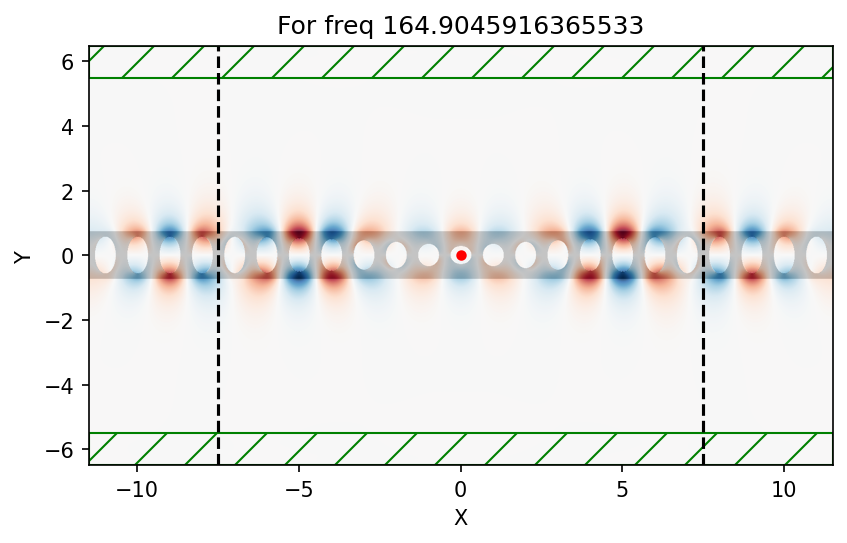

     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

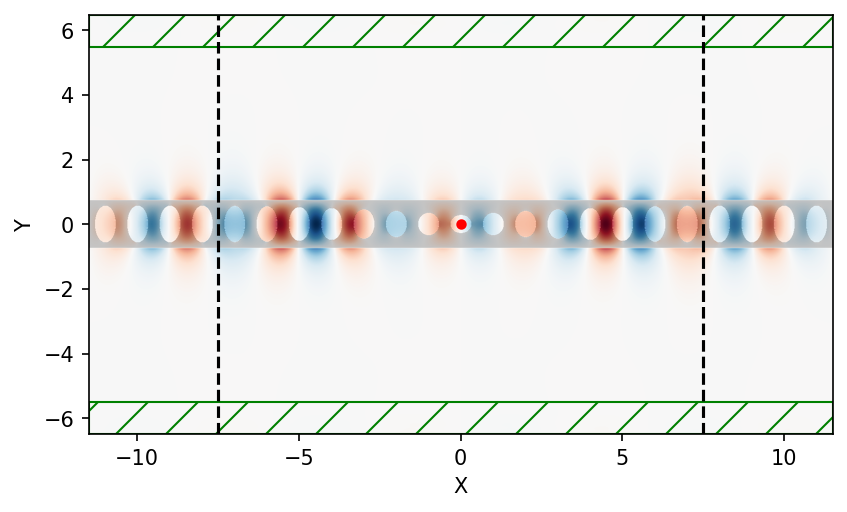

     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

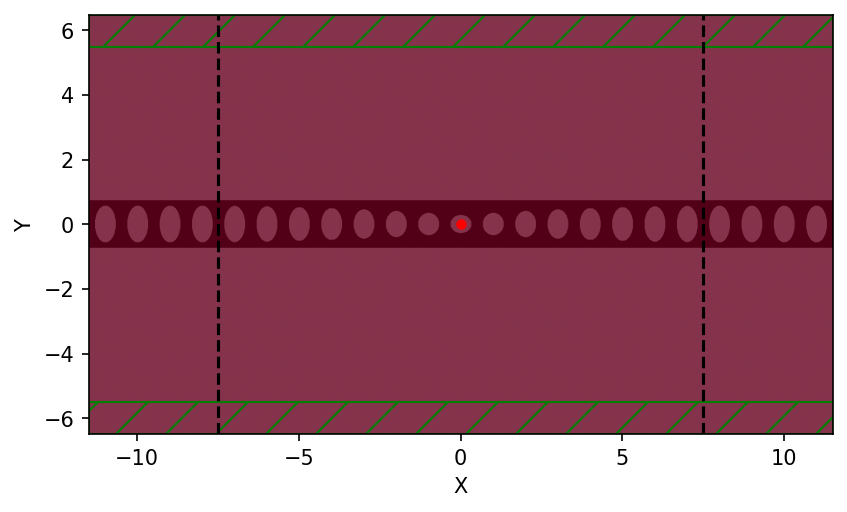

     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

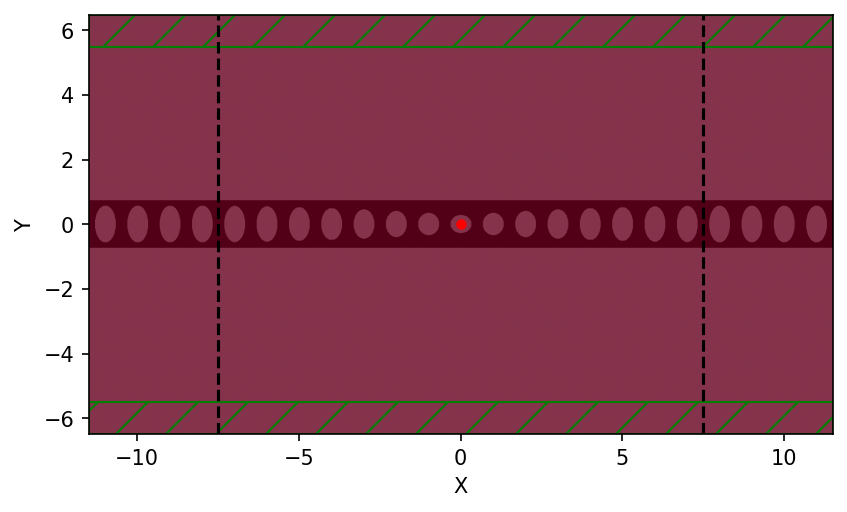

     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

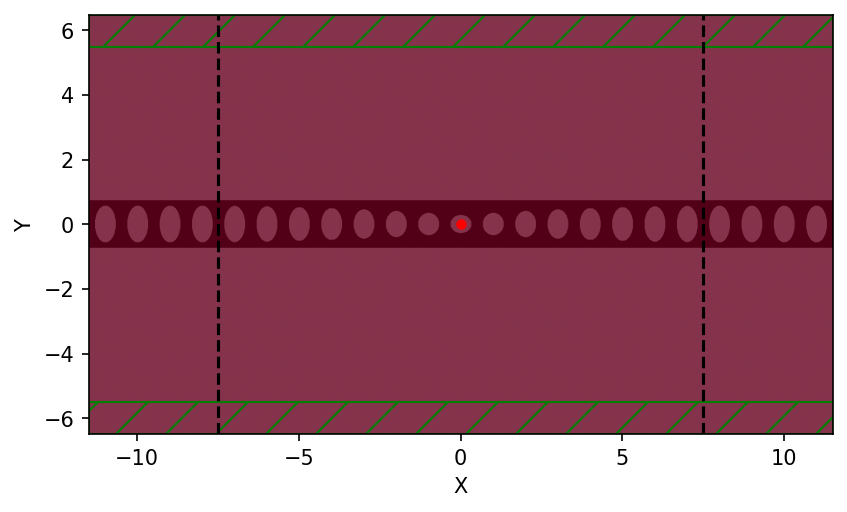

     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

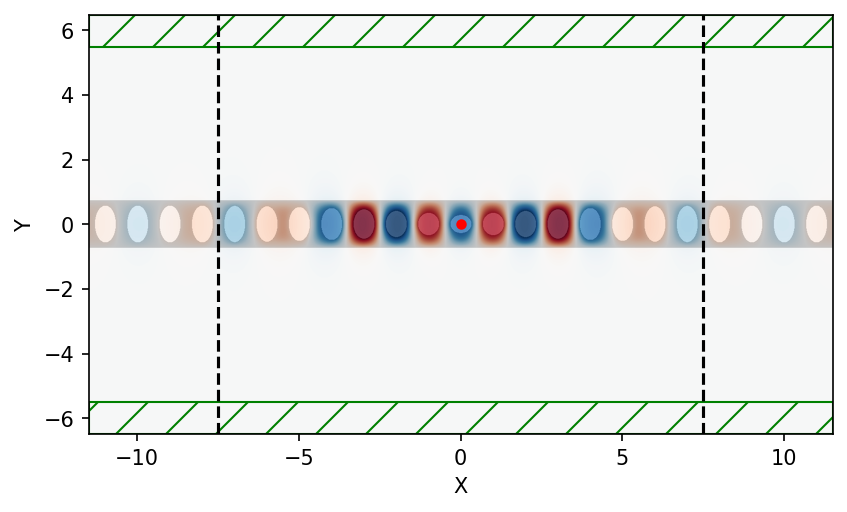

0.19142835605846037
-----------
Initializing structure...
Halving computational cell along direction x
Halving computational cell along direction y
time for choose_chunkdivision = 0.000503063 s
Working in 2D dimensions.
Computational cell is 23 x 12.9688 x 0 with resolution 64
     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0

run 0 finished at t = 700.0 (89600 timesteps)
     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          ax

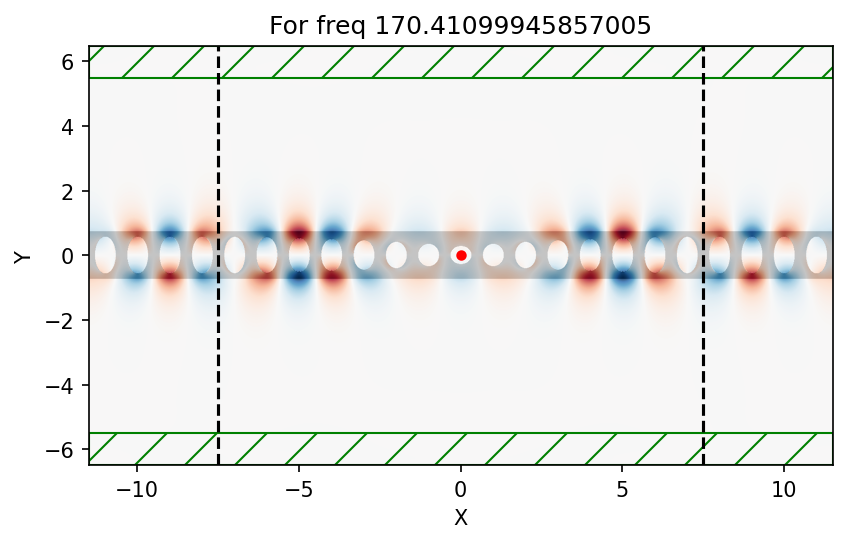

     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

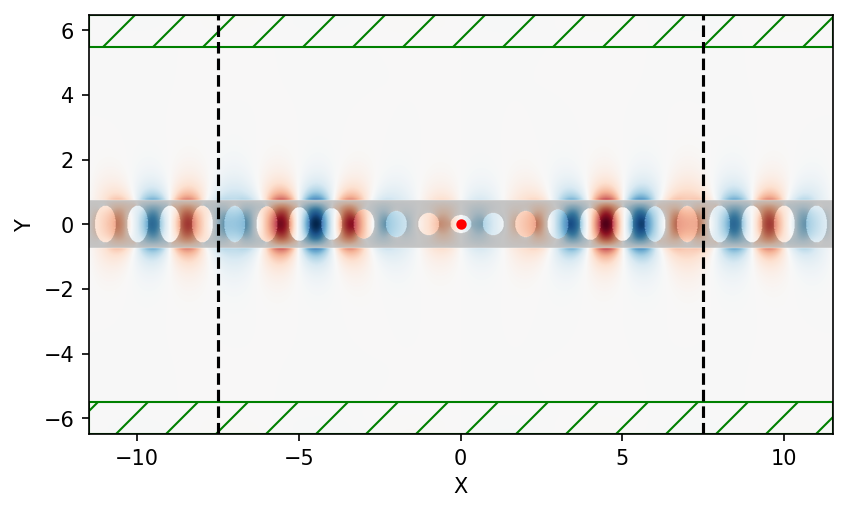

     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

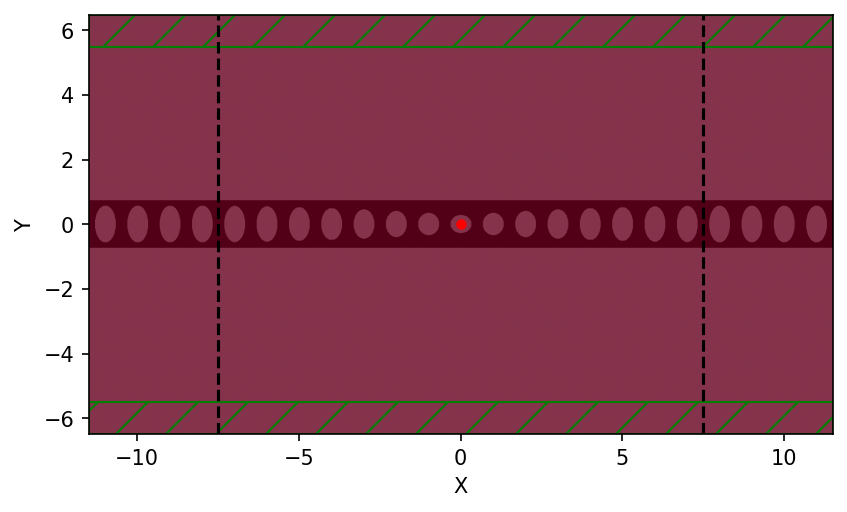

     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

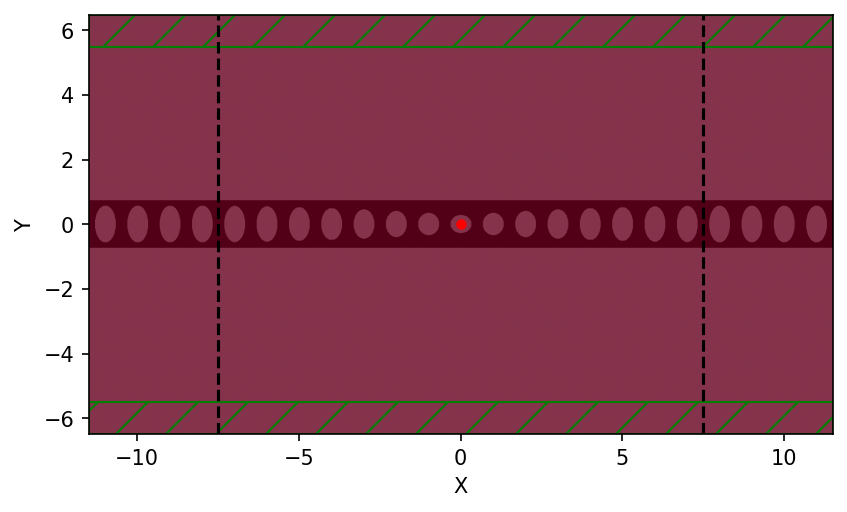

     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

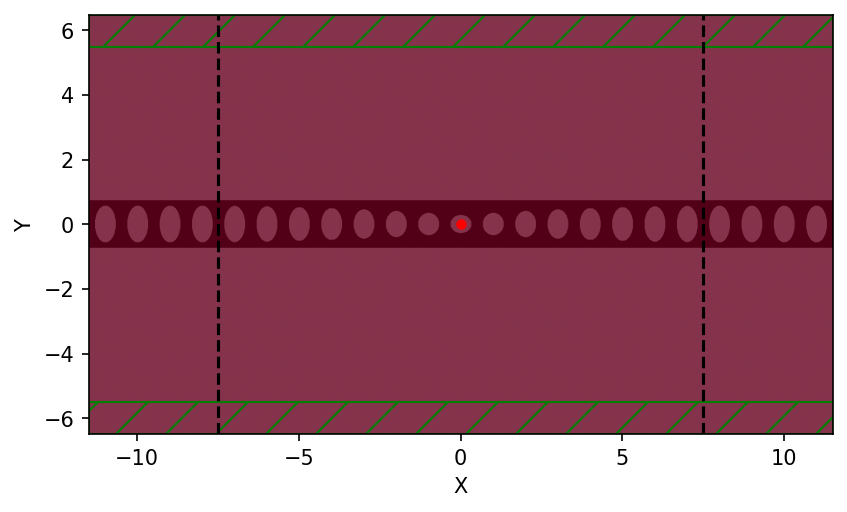

     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

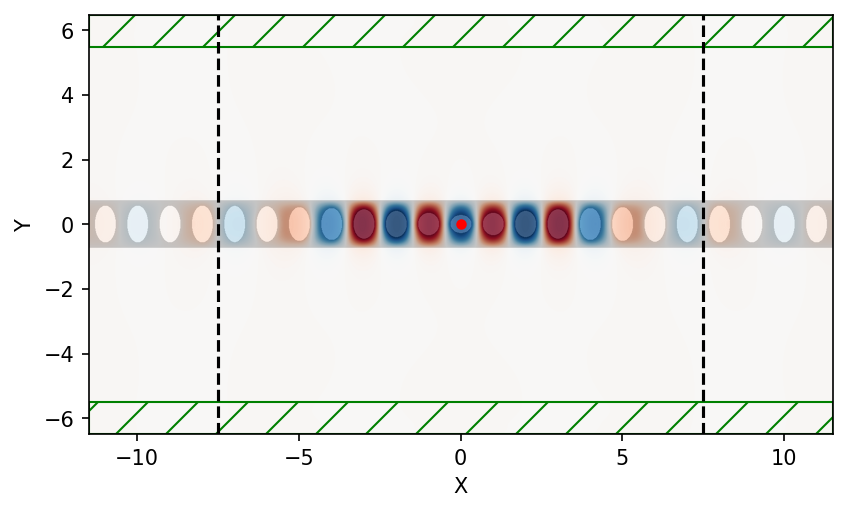

0.21781962910279518
-----------
Initializing structure...
Halving computational cell along direction x
Halving computational cell along direction y
time for choose_chunkdivision = 0.000708103 s
Working in 2D dimensions.
Computational cell is 23 x 12.9688 x 0 with resolution 64
     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0

run 0 finished at t = 700.0 (89600 timesteps)
     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          ax

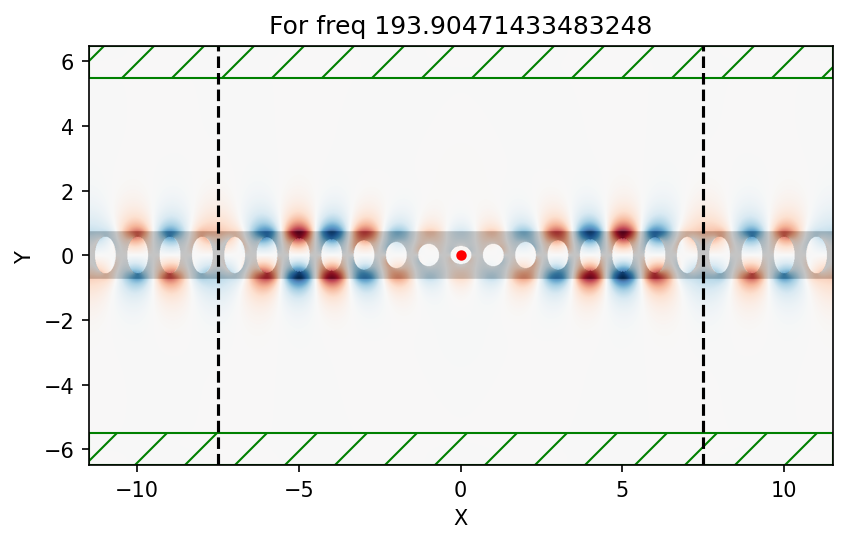

     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

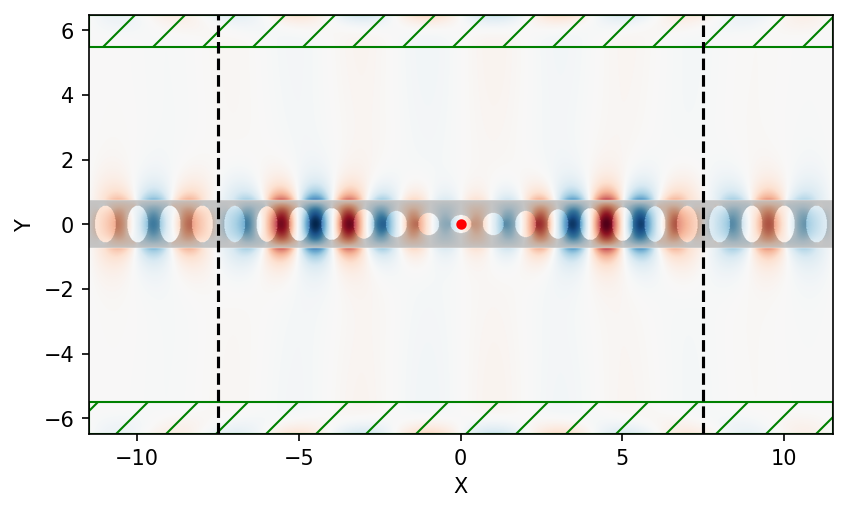

     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

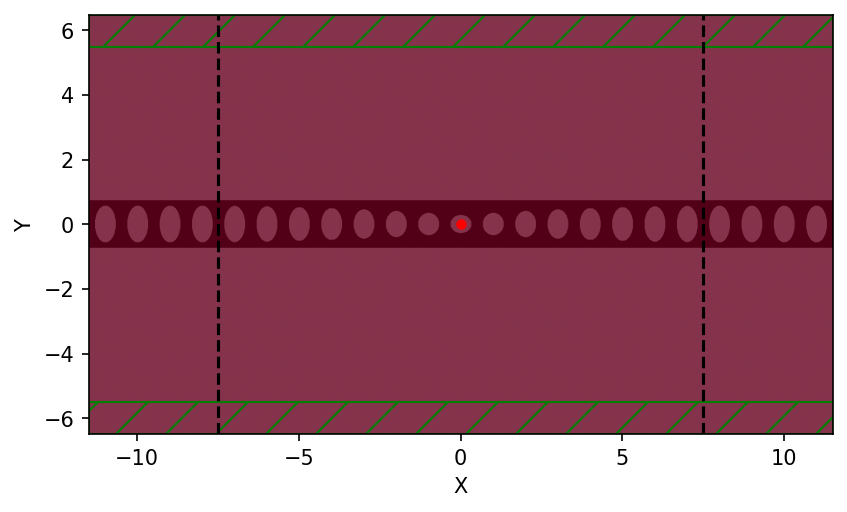

     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

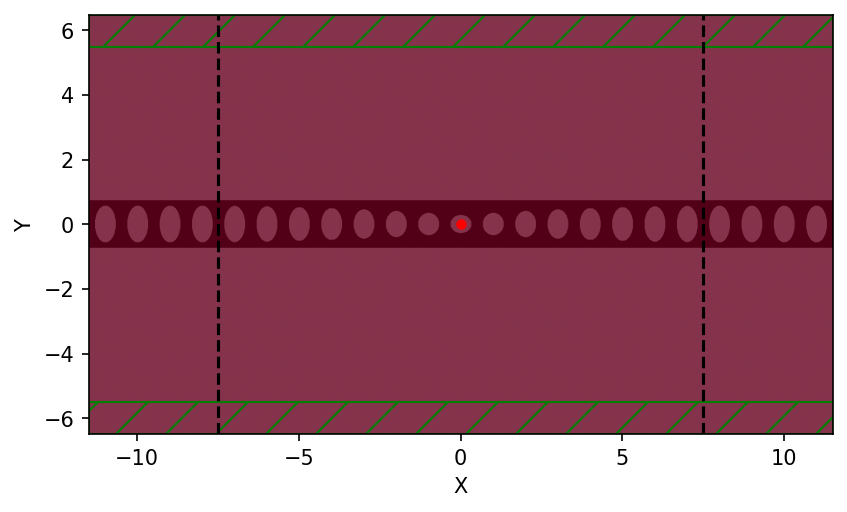

     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

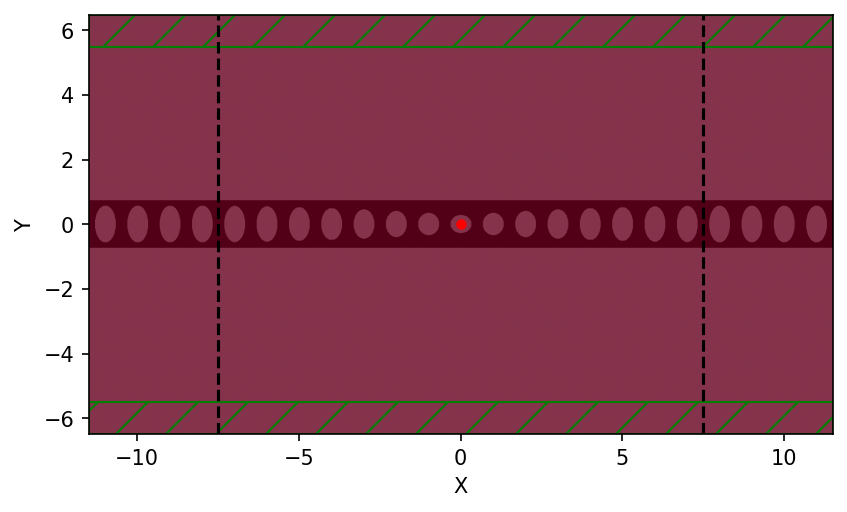

     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

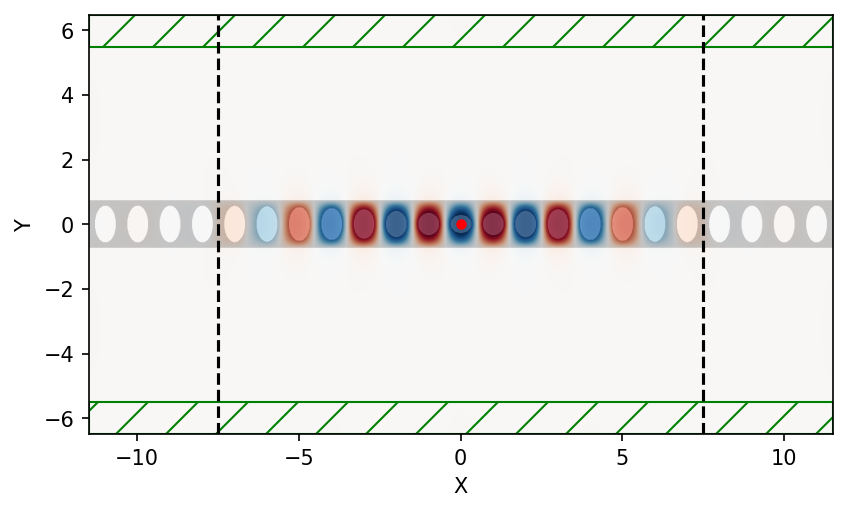

0.260933748145997
-----------
Initializing structure...
Halving computational cell along direction x
Halving computational cell along direction y
time for choose_chunkdivision = 0.00142694 s
Working in 2D dimensions.
Computational cell is 23 x 12.9688 x 0 with resolution 64
     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
 

run 0 finished at t = 700.0 (89600 timesteps)
     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          ax

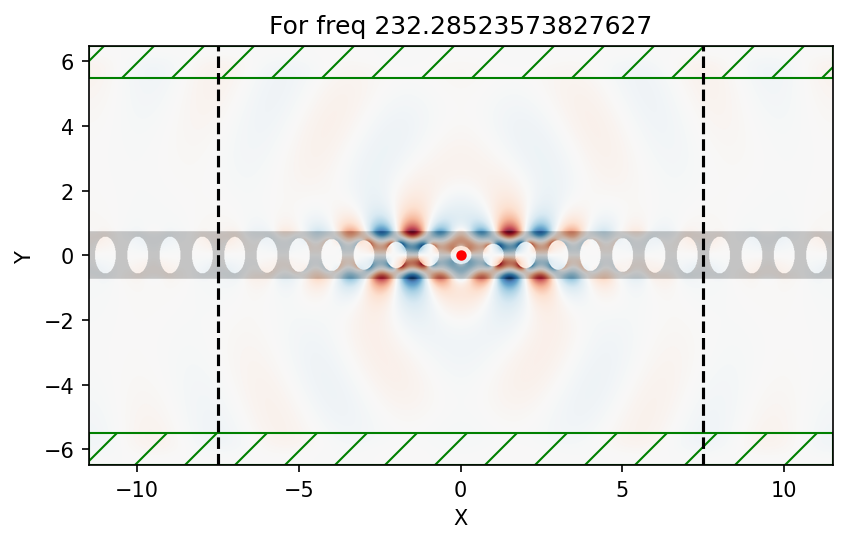

     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

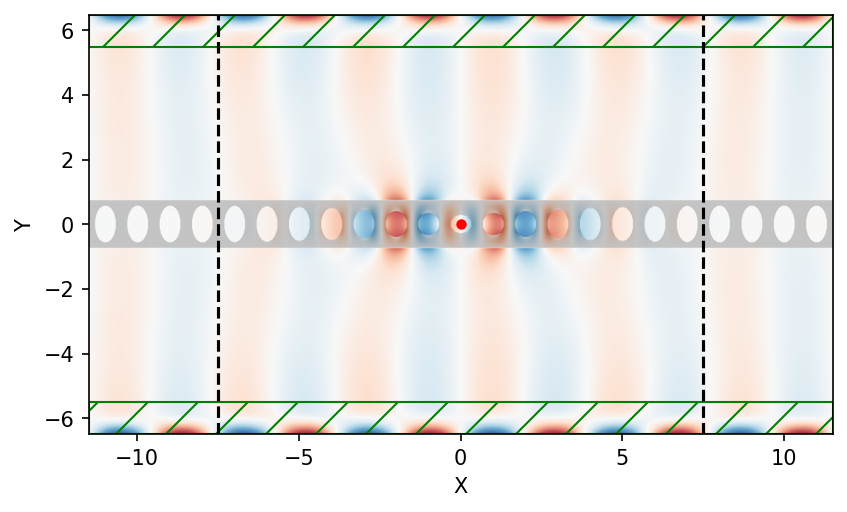

     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

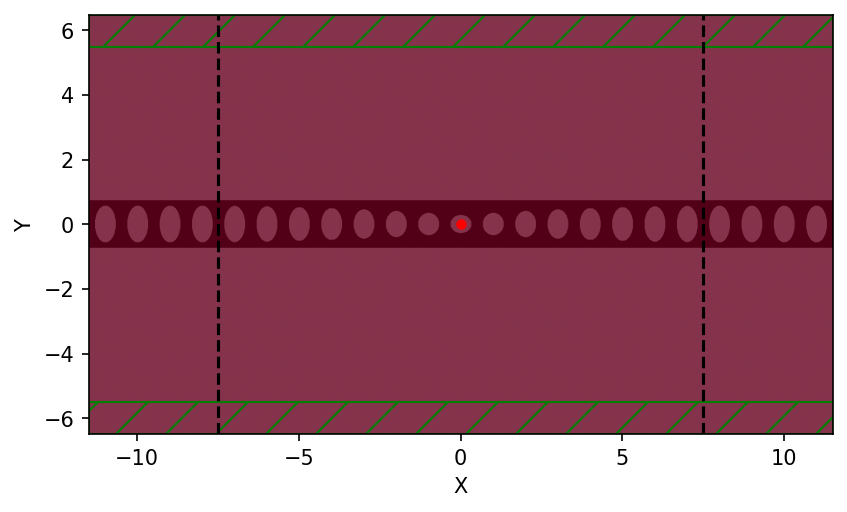

     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

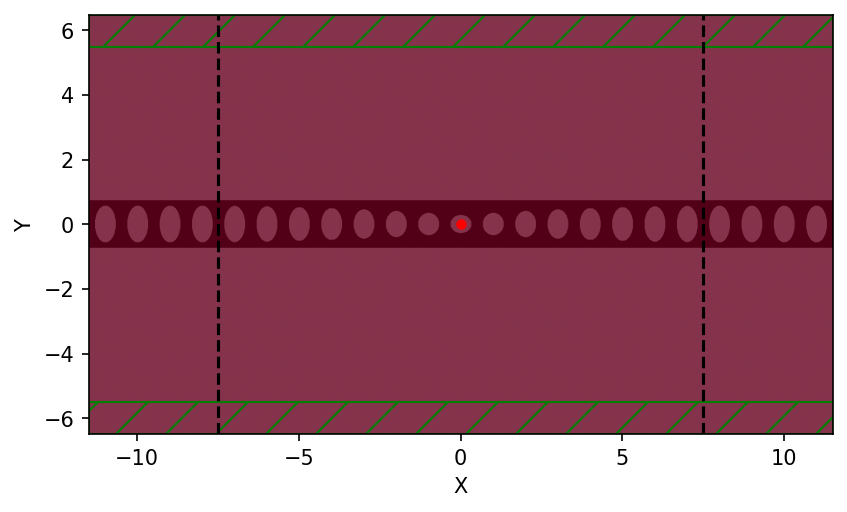

     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

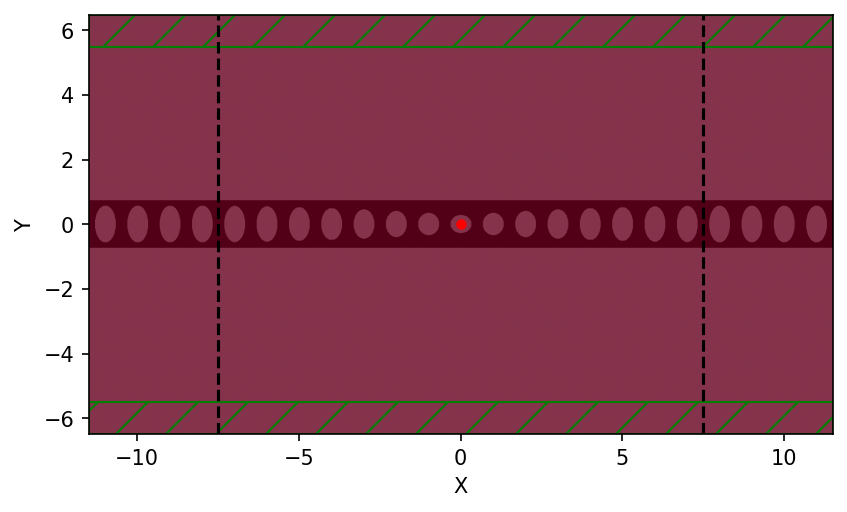

     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

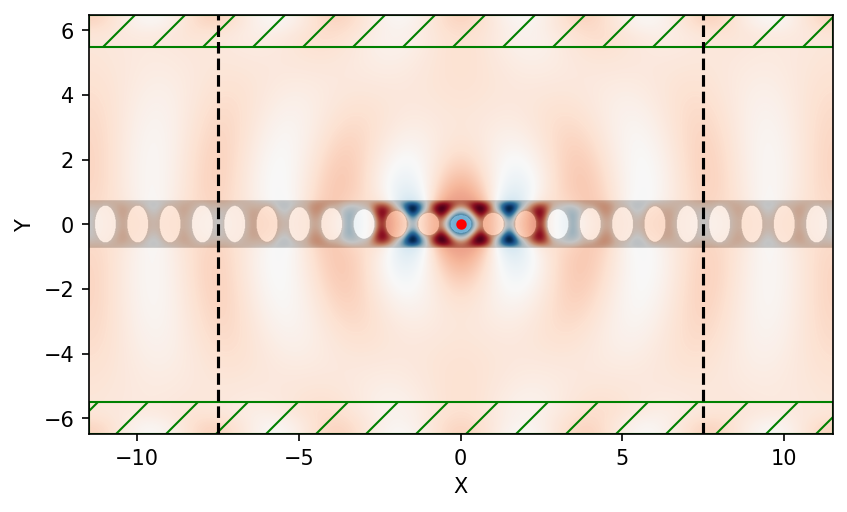

0.27958082404159434
-----------
Initializing structure...
Halving computational cell along direction x
Halving computational cell along direction y
time for choose_chunkdivision = 0.00108194 s
Working in 2D dimensions.
Computational cell is 23 x 12.9688 x 0 with resolution 64
     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)

run 0 finished at t = 700.0 (89600 timesteps)
     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          ax

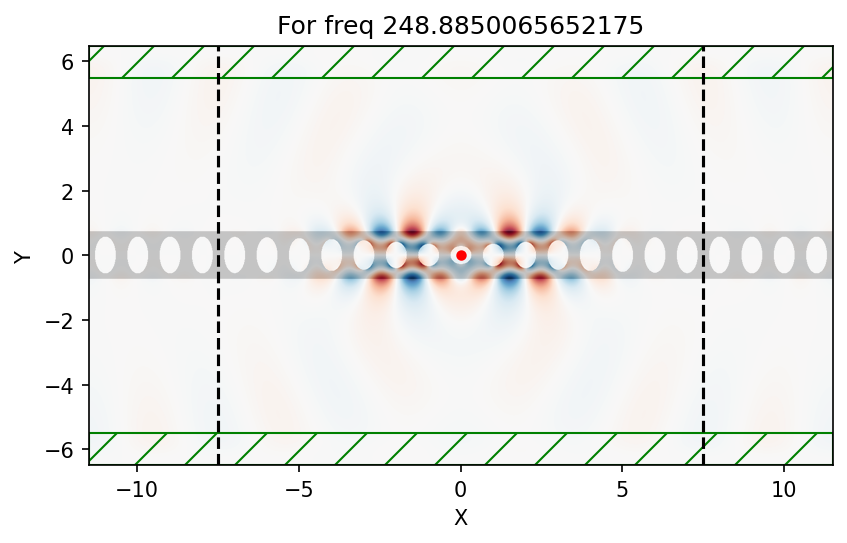

     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

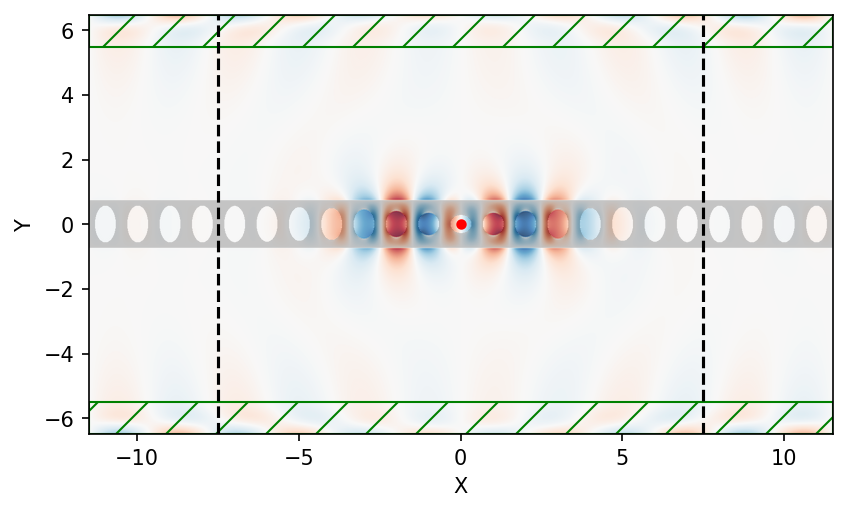

     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

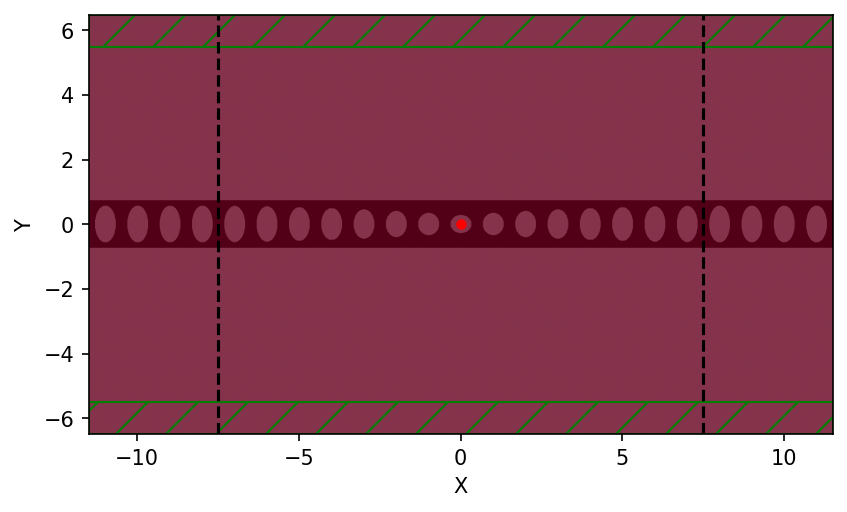

     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

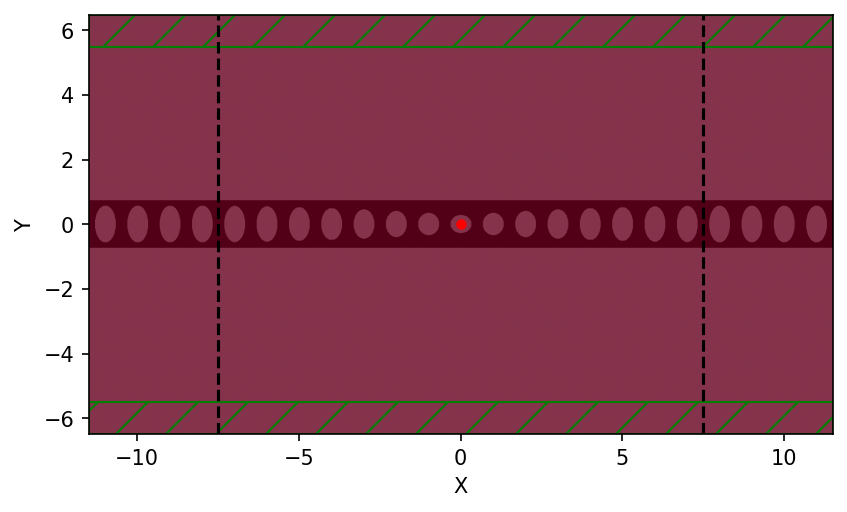

     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

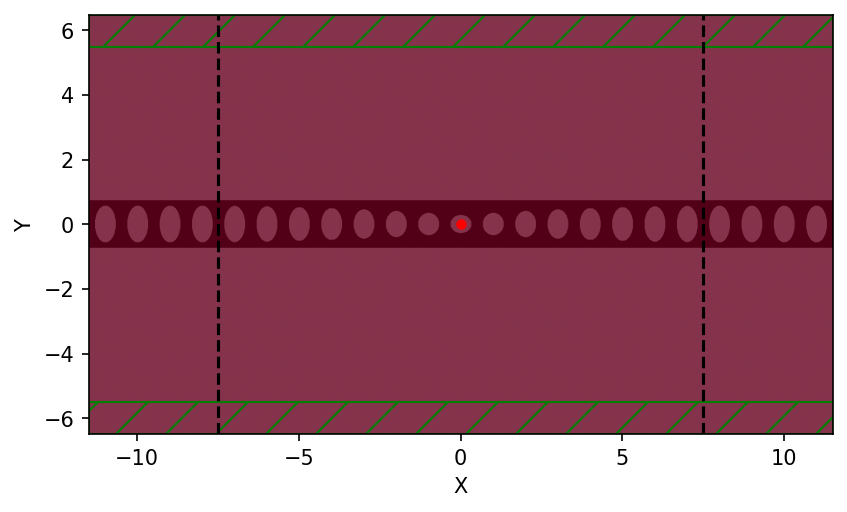

     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

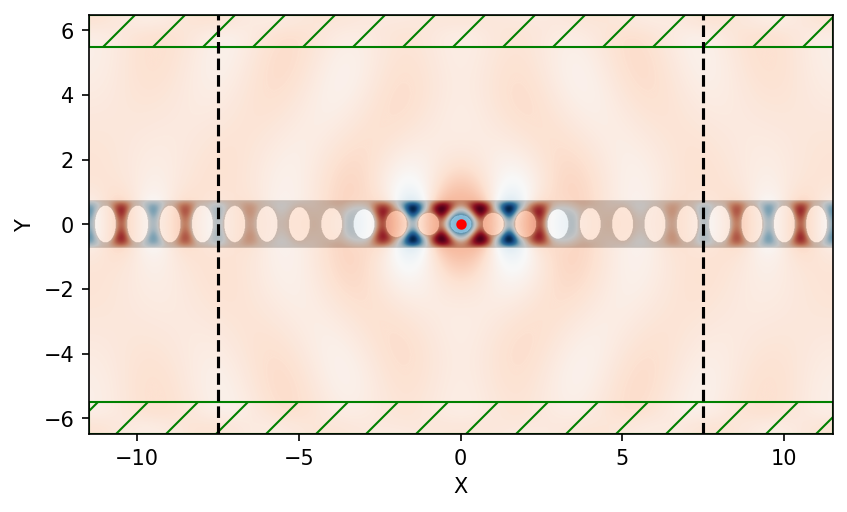

0.29491857498140917
-----------
Initializing structure...
Halving computational cell along direction x
Halving computational cell along direction y
time for choose_chunkdivision = 0.00128484 s
Working in 2D dimensions.
Computational cell is 23 x 12.9688 x 0 with resolution 64
     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)

run 0 finished at t = 700.0 (89600 timesteps)
     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          ax

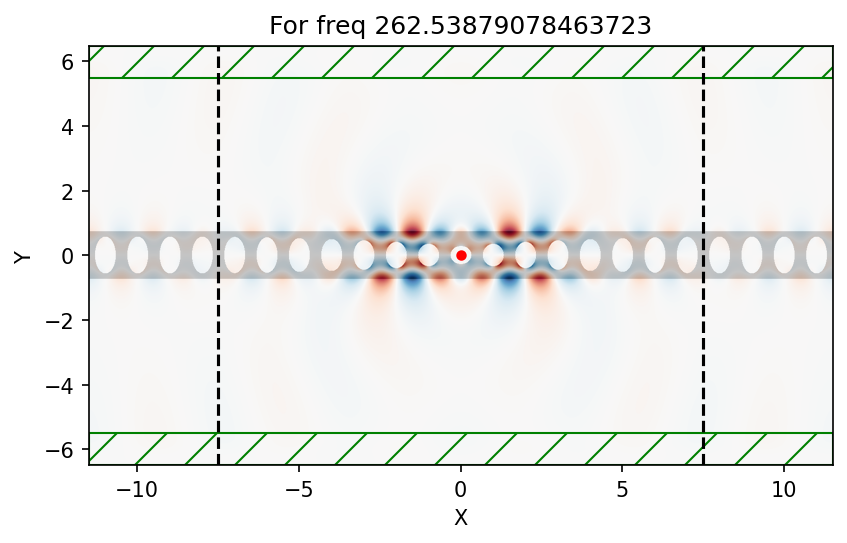

     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

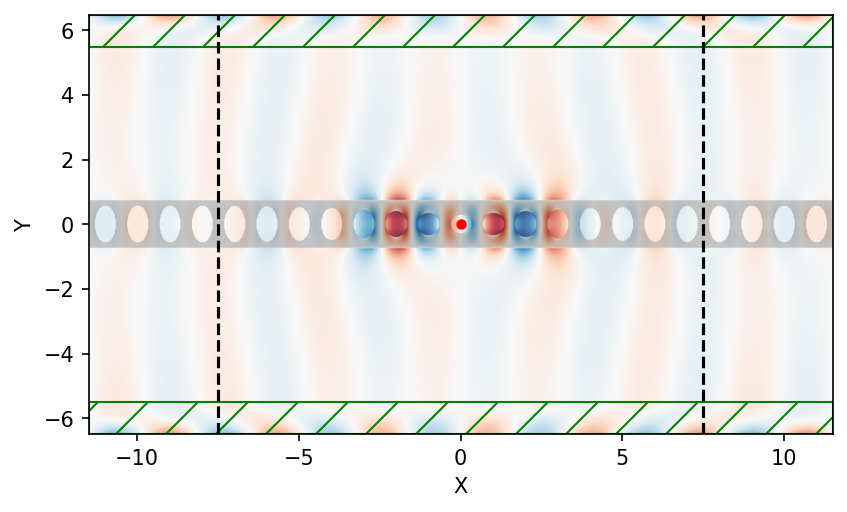

     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

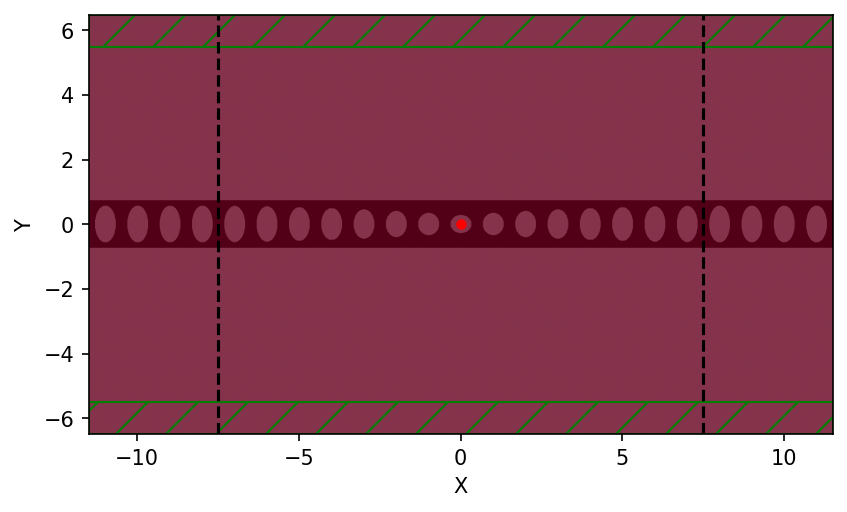

     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

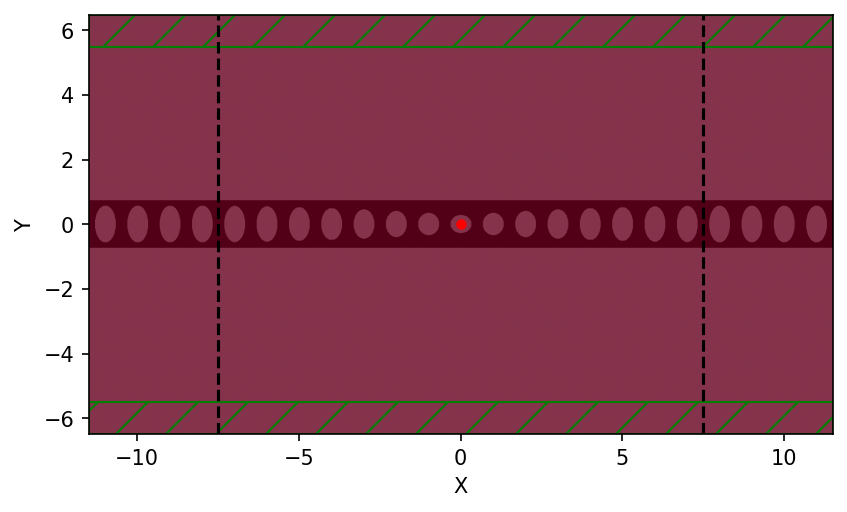

     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

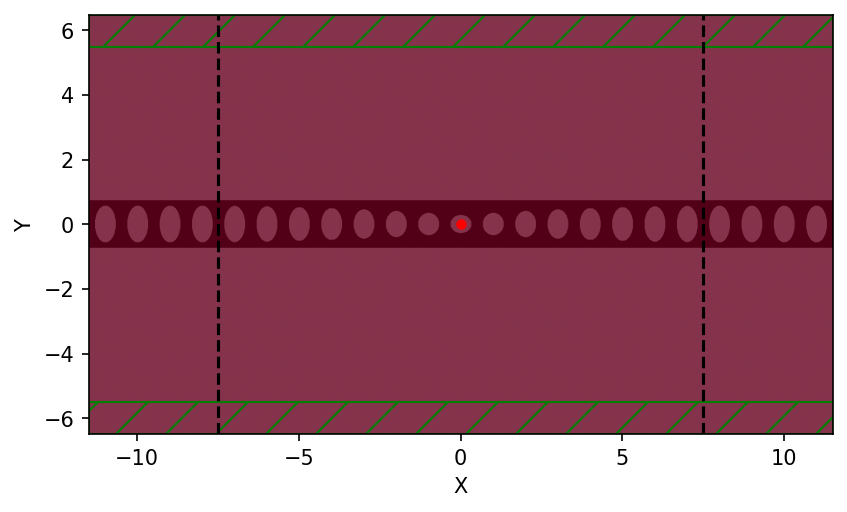

     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

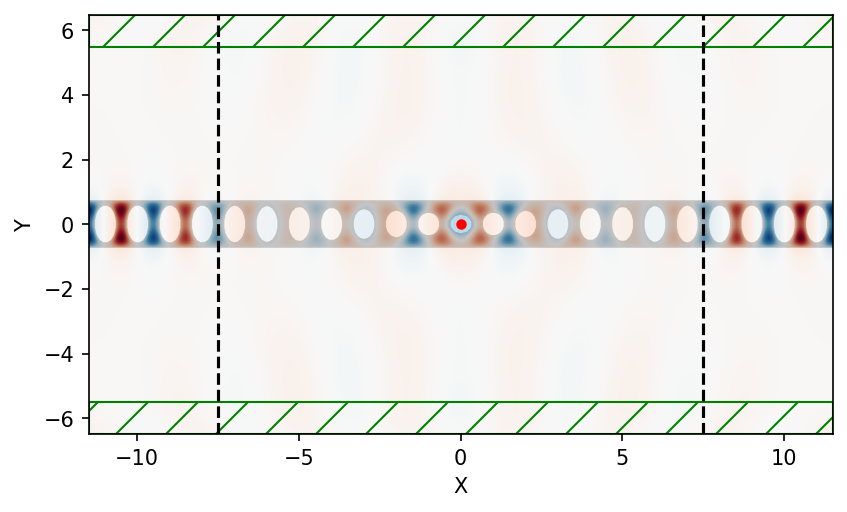

0.3007316777643165
-----------
Initializing structure...
Halving computational cell along direction x
Halving computational cell along direction y
time for choose_chunkdivision = 0.000697136 s
Working in 2D dimensions.
Computational cell is 23 x 12.9688 x 0 with resolution 64
     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)

KeyboardInterrupt: 

In [6]:
for i in range(len(freqs)):
    if Qs[i]>0:
        print(freqs[i])
        simulations(500, length = 337, xlength= 218, ylengths = taperr, mirrorlength=382, nummirrors = 4, freq = freqs[i])



     block, center = (0,0,0)
          size (19,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

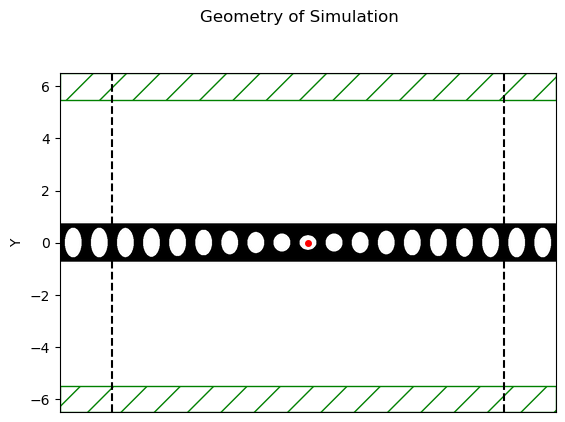

-----------
Initializing structure...
Halving computational cell along direction x
Halving computational cell along direction y
time for choose_chunkdivision = 0.00361204 s
Working in 2D dimensions.
Computational cell is 19 x 12.9688 x 0 with resolution 64
     block, center = (0,0,0)
          size (19,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.6

KeyboardInterrupt: 

In [ ]:
Qs2, freqs2 = tapered(500, length = 337, xlength= 218, ylengths = taperr, mirrorlength=382, nummirrors = 2)

0.12687637252477818
-----------
Initializing structure...
Halving computational cell along direction x
Halving computational cell along direction y
time for choose_chunkdivision = 0.000828981 s
Working in 2D dimensions.
Computational cell is 19 x 12.9688 x 0 with resolution 64
     block, center = (0,0,0)
          size (19,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0

run 0 finished at t = 800.0 (102400 timesteps)
     block, center = (0,0,0)
          size (19,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          a

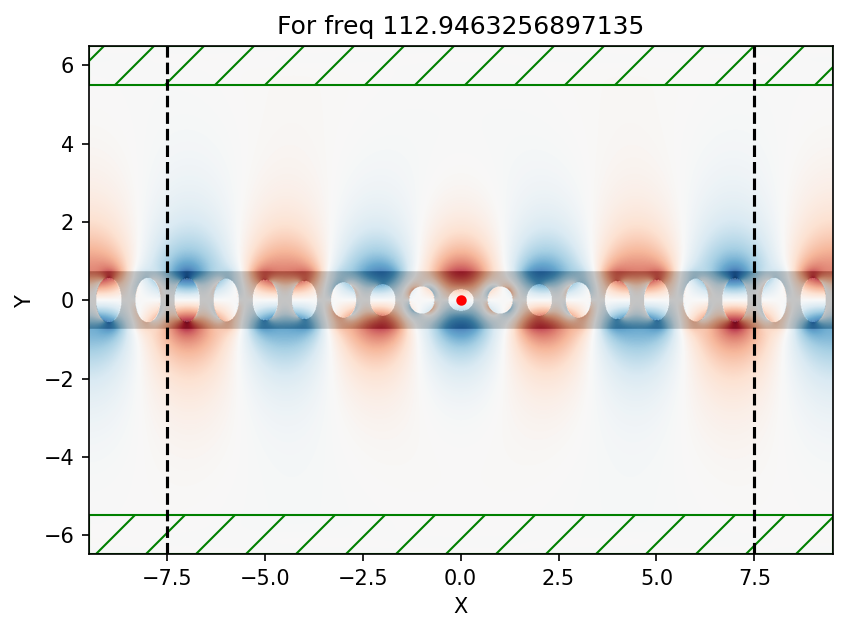

     block, center = (0,0,0)
          size (19,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

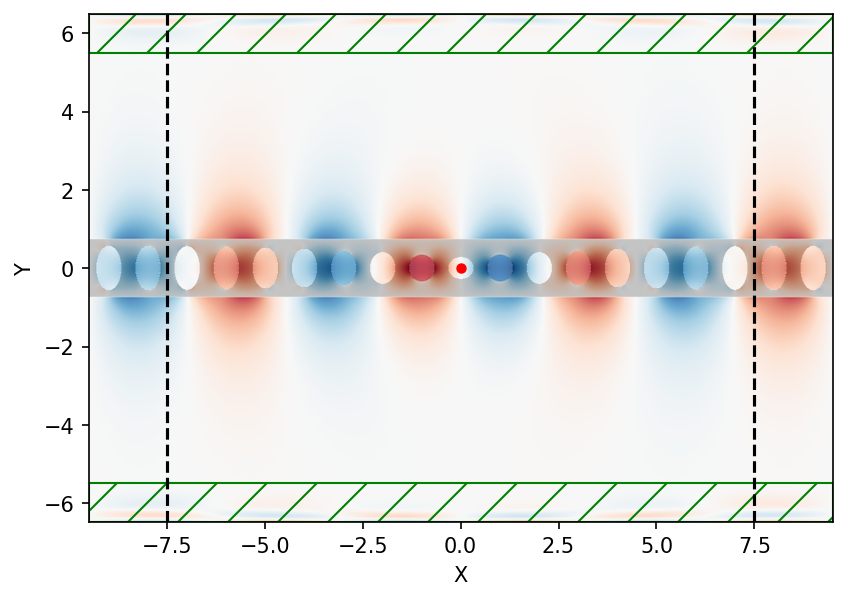

     block, center = (0,0,0)
          size (19,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

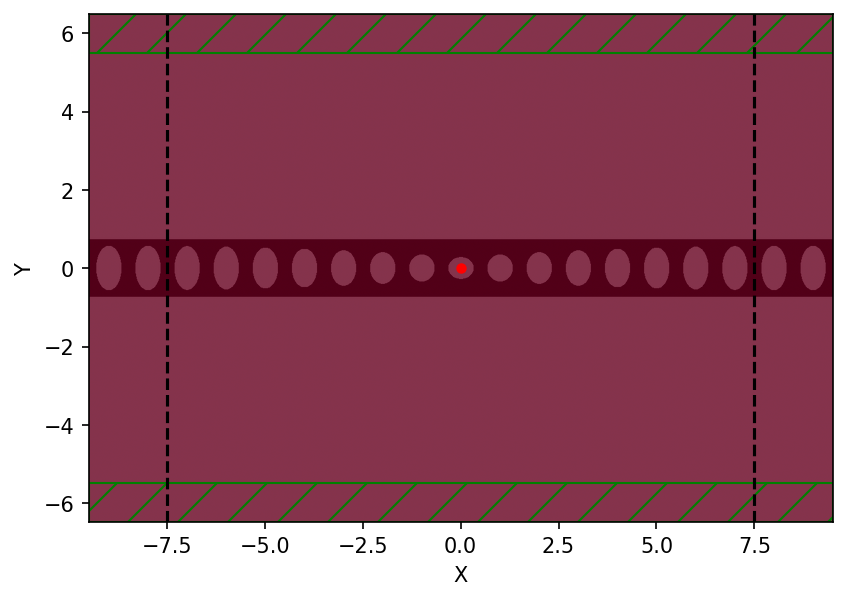

     block, center = (0,0,0)
          size (19,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

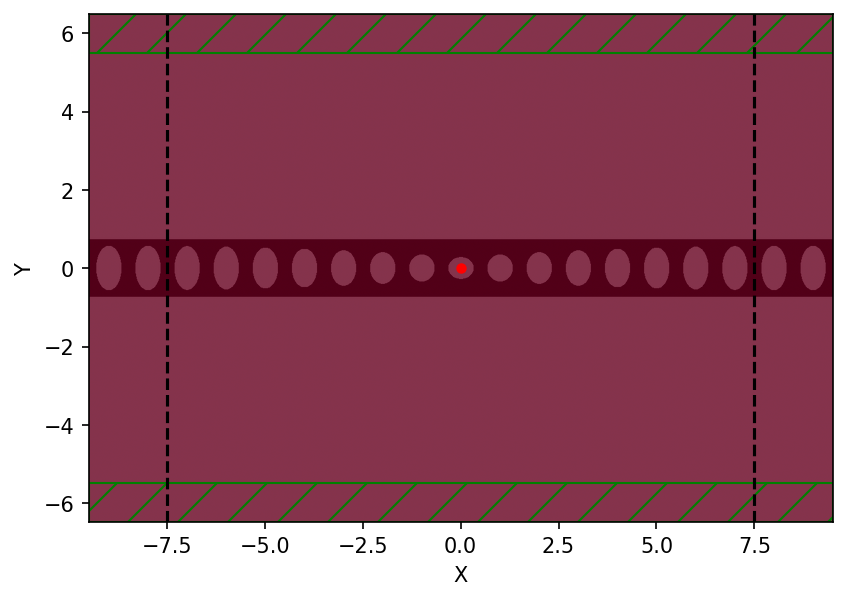

     block, center = (0,0,0)
          size (19,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

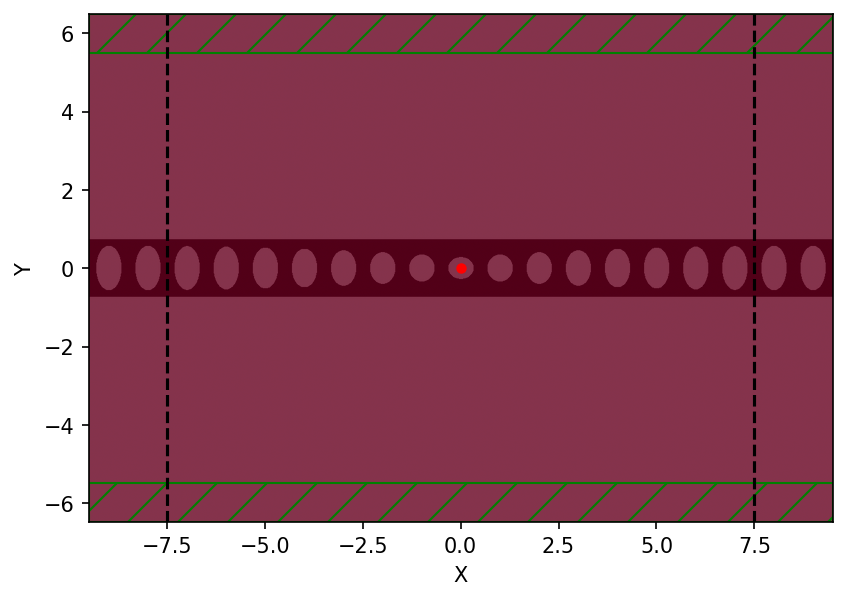

     block, center = (0,0,0)
          size (19,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

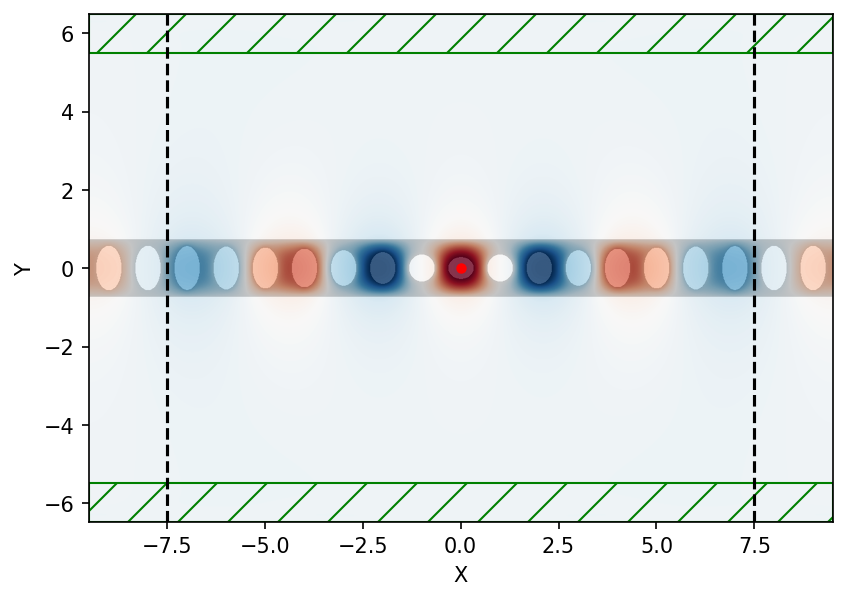

0.1428808093896224
-----------
Initializing structure...
Halving computational cell along direction x
Halving computational cell along direction y
time for choose_chunkdivision = 0.000607967 s
Working in 2D dimensions.
Computational cell is 19 x 12.9688 x 0 with resolution 64
     block, center = (0,0,0)
          size (19,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)

KeyboardInterrupt: 

In [ ]:
for i in range(len(freqs2)):
    if Qs2[i]>0:
        print(freqs2[i])
        simulations(500, length = 337, xlength= 218, ylengths = taperr, mirrorlength=382, nummirrors = 2, freq = freqs2[i])

